# Context

## Stroke Prediction Dataset
Available at: https://www.kaggle.com/fedesoriano/stroke-prediction-dataset

According to the World Health Organization (WHO) stroke is the 2nd leading cause of death globally, responsible for approximately 11% of total deaths.
This dataset is used to predict whether a patient is likely to get stroke based on the input parameters like gender, age, various diseases, and smoking status. Each row in the data provides relavant information about the patient.

## Attribute Information
1) id: unique identifier

2) gender: "Male", "Female" or "Other"

3) age: age of the patient

4) hypertension: 0 if the patient doesn't have hypertension, 1 if the patient has hypertension

5) heart_disease: 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease

6) ever_married: "No" or "Yes"

7) work_type: "children", "Govt_jov", "Never_worked", "Private" or "Self-employed"

8) Residence_type: "Rural" or "Urban"

9) avg_glucose_level: average glucose level in blood

10) bmi: body mass index

11) smoking_status: "formerly smoked", "never smoked", "smokes" or "Unknown"*

12) stroke: 1 if the patient had a stroke or 0 if not

*Note: "Unknown" in smoking_status means that the information is unavailable for this patient

## Acknowledgements
(Confidential Source) - Use only for educational purposes
If you use this dataset in your research, please credit the author.

## Other Datasets
Hepatitis C Dataset: LINK

# Libraries

In [2]:
# jupyter core
from IPython.core.display      import display, HTML
from IPython.display           import Image

# data imports
import pandas.io.sql as psql
import psycopg2 as pg

# data manipulation
import inflection
import datetime
import math
import random
import numpy as np
import pandas as pd
from scipy import stats as ss

# EDA
import pandas_profiling as pr
import seaborn as sns
import matplotlib.pyplot as plt

# preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder

# balancing response variable
from imblearn import combine as c

# feature selection
import boruta as bt

# ML models
from sklearn import model_selection as ms
from sklearn import linear_model as lm
from sklearn import neighbors as nh
from sklearn import ensemble as en
from sklearn import svm
from sklearn import tree
from catboost import CatBoostClassifier
from xgboost import XGBClassifier

# metrics
from sklearn import metrics as m
from scikitplot.metrics import plot_calibration_curve, plot_cumulative_gain, plot_lift_curve, plot_ks_statistic
from yellowbrick.features import ParallelCoordinates
from yellowbrick.classifier import ClassificationReport, ConfusionMatrix, ROCAUC, PrecisionRecallCurve
from yellowbrick.contrib.wrapper import wrap

# hyperparameter fine tuning
import hyperopt
import ray
from ray import tune

# Functions

In [1087]:
# jupyter setup
def jupyter_settings():
    
    # jupyter core settings
    display(HTML("<style>.container { width:100% !important; }</style>"))
    !pylab inline
    
    # pandas
    pd.set_option('display.max_rows', 500)
    pd.set_option('display.max_columns', 500)
    pd.set_option('display.expand_frame_repr', False)
    
    # matplotlib
    !matplotlib inline
    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [35, 12]
    plt.rcParams['font.size'] = 40
    
    # seaborn
    sns.set()

# descriptive analysis summary for numerical features
def num_analysis(num_attributes):
    # Cemtral tendency - mean, median
    ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
    ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

    # Dispersion - std, min, max, range, skew, kurtosis
    d1 = pd.DataFrame(num_attributes.apply(np.std)).T
    d2 = pd.DataFrame(num_attributes.apply(min)).T
    d3 = pd.DataFrame(num_attributes.apply(max)).T
    d4 = pd.DataFrame(num_attributes.apply(lambda x: x.max() - x.min())).T
    d5 = pd.DataFrame(num_attributes.apply(lambda x: x.skew())).T
    d6 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis())).T

    # concatenate
    m = pd.concat([d2,d3,d4,ct1,ct2,d1,d5,d6]).T.reset_index()
    m.columns = ['attributes','min','max','range','mean','median','std','skew','kurtosis',]
    
    # histogram
    hist = num_attributes.hist(bins=30)
    
    return m

    return hist

def cramer_v (x,y):
    cm = pd.crosstab(x, y).values
    n = cm.sum()
    r, k = cm.shape
    
    chi2 = ss.chi2_contingency(cm)[0]
    chi2corr = max(0, chi2 - (k-1)*(r-1)/(n-1))
    
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (r-1)**2/(n-1)
    
    return np.sqrt((chi2corr/n) / (min(kcorr-1,rcorr-1)))

def classif_metrics(yvalidation, yhat):
    m_result = {}
    m_result['accuracy'] = m.accuracy_score(yvalidation, yhat)
    m_result['balanced_accuracy'] = m.balanced_accuracy_score(yvalidation, yhat)
    m_result['recall'] = m.recall_score(yvalidation, yhat)
    m_result['precision'] = m.precision_score(yvalidation, yhat)
    m_result['f1'] = m.f1_score(yvalidation, yhat)
    
    return m_result

def cross_validation_classification(df5, model_name, model):
    acc_list = []
    bal_acc_list = []
    recall_list = []
    precision_list = []
    f1_list = []
    for i in range(0,5):  
        # beggining and end of validation set in df
        initial_val = int(df5.shape[0]/5)*i
        end_val = int(df5.shape[0]/5)*(i+1)
        
        # filtering dataset
        training = df5.drop(df5.index[initial_val:end_val])
        validation = df5[initial_val:end_val]
        
        # training
        xtraining = training.drop('stroke', axis=1)
        ytraining = training['stroke'].copy()
        
        # validation
        xvalidation = validation.drop('stroke', axis=1)
        yvalidation = validation['stroke']
        
        # model
        model = model.fit(xtraining, ytraining)
        
        # prediction
        yhat = model.predict(xvalidation)
        
        # performance
        m_result = classif_metrics(yvalidation, yhat)
        
        # store performance of each kfold iteration
        acc_list.append(m_result['accuracy'])
        bal_acc_list.append(m_result['balanced_accuracy'])
        recall_list.append(m_result['recall'])
        precision_list.append(m_result['precision'])
        f1_list.append(m_result['f1'])
        
    return pd.DataFrame({'Model Name': model_name, 
                         'Accuracy': np.round(np.mean(acc_list), 3).astype(str) + '+-' + np.round(np.std(acc_list), 3).astype(str),
                         'Balanced Accuracy': np.round(np.mean(bal_acc_list), 3).astype(str) + '+-' + np.round(np.std(bal_acc_list), 3).astype(str),
                         'Recall': np.round(np.mean(recall_list), 3).astype(str) + '+-' + np.round(np.std(recall_list), 3).astype(str),
                         'Precision': np.round(np.mean(precision_list), 3).astype(str) + '+-' + np.round(np.std(precision_list), 3).astype(str),
                         'F1': np.round(np.mean(f1_list), 3).astype(str) + '+-' + np.round(np.std(f1_list), 3).astype(str)}, index=[0])

def cv_performance_models(data, classifiers):
    # build dataframe
    df = pd.DataFrame()
    for i, j in classifiers:
        cv = cross_validation_classification(data, i, j)
        df = pd.concat([df, cv], axis=0)
        
    # return DataFrame
    return df

In [742]:
jupyter_settings()

'pylab' nÆo ‚ reconhecido como um comando interno
ou externo, um programa oper vel ou um arquivo em lotes.
'matplotlib' nÆo ‚ reconhecido como um comando interno
ou externo, um programa oper vel ou um arquivo em lotes.


# 1. Data Description

In [60]:
df1 = pd.read_csv(r'C:\Users\lucas\Desktop\Comunidade DS\Projetos menores\stroke_prediction\data\raw\healthcare-dataset-stroke-data.csv')
df1

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


## Data types

In [61]:
print('Number of rows: ', df1.shape[0])
print('Number of columns: ', df1.shape[1])

Number of rows:  5110
Number of columns:  12


In [62]:
df1.dtypes

id                     int64
gender                object
age                  float64
hypertension           int64
heart_disease          int64
ever_married          object
work_type             object
Residence_type        object
avg_glucose_level    float64
bmi                  float64
smoking_status        object
stroke                 int64
dtype: object

In [63]:
df1['id'].duplicated().sum()

0

## Check NA

In [64]:
df1.isna().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

## NA Fillout

In [65]:
pd.isnull(df1).any(axis=1)

0       False
1        True
2       False
3       False
4       False
        ...  
5105     True
5106    False
5107    False
5108    False
5109    False
Length: 5110, dtype: bool

In [66]:
df1.dropna(inplace=True)

In [15]:
num_attributes = df1.select_dtypes(include=['float64', 'int64'])
cat_attributes = df1.select_dtypes(exclude=['float64', 'int64'])

## Numerical Attributes

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,id,77.00,72940.00,72863.00,37064.313506,37608.00,20992.959919,-0.039951,-1.205060
1,age,0.08,82.00,81.92,42.865374,44.00,22.552818,-0.119070,-0.988091
2,hypertension,0.00,1.00,1.00,0.091872,0.00,0.288845,2.826791,5.993192
3,heart_disease,0.00,1.00,1.00,0.049501,0.00,0.216911,4.155030,15.270496
4,avg_glucose_level,55.12,271.74,216.62,105.305150,91.68,44.419816,1.614026,1.905601
5,bmi,10.30,97.60,87.30,28.893237,28.10,7.853267,1.055340,3.362659
6,stroke,0.00,1.00,1.00,0.042575,0.00,0.201897,4.532666,18.552620


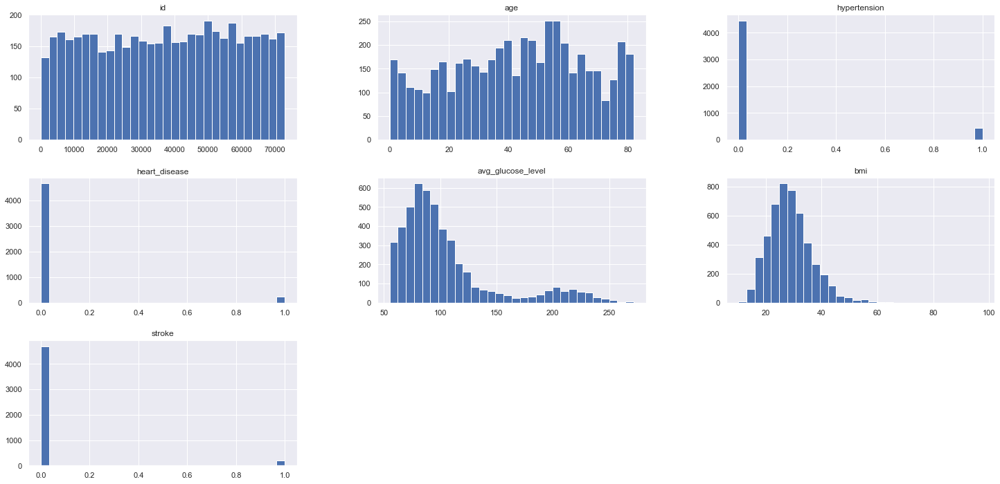

In [16]:
num_analysis(num_attributes)

## Categorical Attributes

In [23]:
pd.DataFrame(cat_attributes.apply(lambda x: x.unique())).T

,gender,ever_married,work_type,Residence_type,smoking_status
0,"[Male, Female, Other]","[Yes, No]","[Private, Self-employed, Govt_job, children, N...","[Urban, Rural]","[formerly smoked, never smoked, smokes, Unknown]"


In [24]:
cat_attributes.apply(lambda x: x.unique().shape)

,gender,ever_married,work_type,Residence_type,smoking_status
0,3,2,5,2,4


<AxesSubplot:xlabel='smoking_status', ylabel='stroke'>

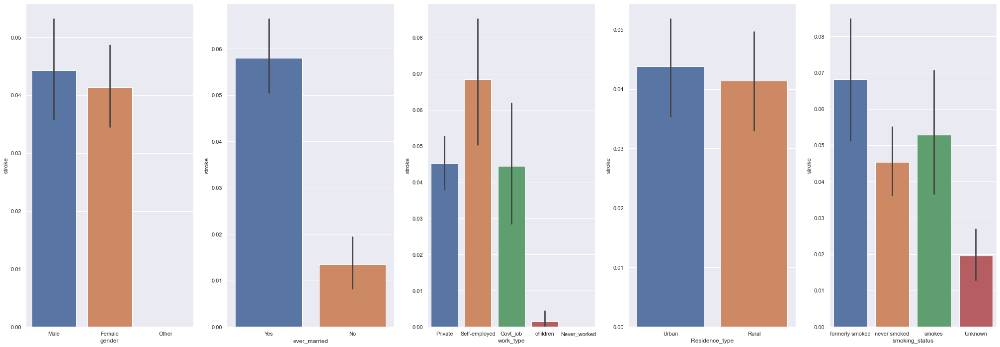

In [41]:
plt.subplot(1,5,1)
sns.barplot(x='gender',y='stroke',data=df1)

plt.subplot(1,5,2)
sns.barplot(x='ever_married',y='stroke',data=df1)

plt.subplot(1,5,3)
sns.barplot(x='work_type',y='stroke',data=df1)

plt.subplot(1,5,4)
sns.barplot(x='Residence_type',y='stroke',data=df1)

plt.subplot(1,5,5)
sns.barplot(x='smoking_status',y='stroke',data=df1)

There is considerable variation between the categories of the following variables: 'ever_married', 'work_type' and 'moking_status'. This makes these variables valuable for predictive performance, and special attention must be given in the encoding stage so they can influence the models learning process as well as they can.

# 2. Feature Engineering

In [67]:
df2 = df1.copy()

In [68]:
df2.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1


In [69]:
# age x avg_glucose_level
df2['age_glucose'] = df2['age'] * df2['avg_glucose_level']
# age x bmi
df2['age_bmi'] = df2['age'] * df2['bmi']
# avg_glucose_level x bmi
df2['glucose_bmi'] = df2['bmi'] * df2['avg_glucose_level']

In [70]:
num_analysis(df2[['age_glucose','age_bmi','glucose_bmi']])

NameError: name 'num_analysis' is not defined

# 3. EDA

In [71]:
df3 = df2.copy()

In [438]:
df3.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,age_glucose,age_bmi,glucose_bmi
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1,15322.23,2452.2,8370.054
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1,8473.60,2600.0,3442.400
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1,8390.27,1685.6,5890.312
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1,13755.48,1896.0,4178.880
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1,15083.01,2349.0,5400.090


## 3.1. Univariate

In [49]:
pr.ProfileReport(df3)

## 3.2. Bivariate

### Categorical x Response

<AxesSubplot:xlabel='smoking_status', ylabel='stroke'>

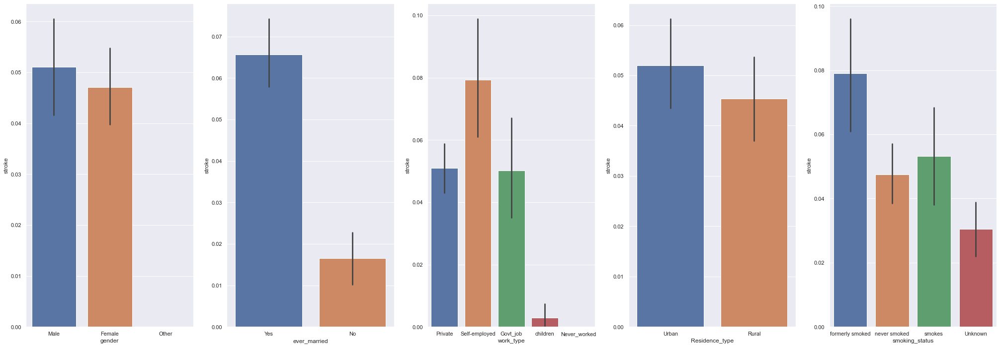

In [449]:
plt.subplot(1,5,1)
sns.barplot(x='gender',y='stroke',data=df1)

plt.subplot(1,5,2)
sns.barplot(x='ever_married',y='stroke',data=df1)

plt.subplot(1,5,3)
sns.barplot(x='work_type',y='stroke',data=df1)

plt.subplot(1,5,4)
sns.barplot(x='Residence_type',y='stroke',data=df1)

plt.subplot(1,5,5)
sns.barplot(x='smoking_status',y='stroke',data=df1)

In [378]:
df3['gender'].unique()

array(['Male', 'Female', 'Other'], dtype=object)

### Categorical x Numerical

c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\li

<AxesSubplot:xlabel='age', ylabel='Density'>

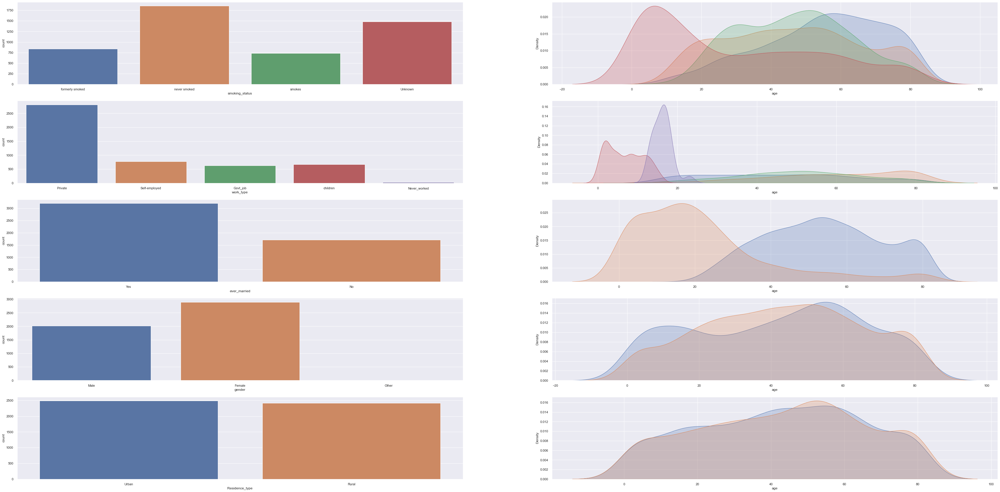

In [802]:
# smoking_statu x age

plt.figure(figsize=(60,30))

plt.subplot(5,2,1)
sns.countplot(df3['smoking_status'])

plt.subplot(5,2,2)
sns.kdeplot(df3[df3['smoking_status'] == 'formerly smoked']['age'], label='formerly smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'never smoked']['age'], label='never smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'smokes']['age'], label='smokes', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'Unknown']['age'], label='unknown', shade=True)

# work_type x bmi
plt.subplot(5,2,3)
sns.countplot(df3['work_type'])

plt.subplot(5,2,4)
sns.kdeplot(df3[df3['work_type'] == 'Private']['age'], label='Private', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Self-employed']['age'], label='Self-employed', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Govt_job']['age'], label='Govt_job', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'children']['age'], label='children', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Never_worked']['age'], label='Never_worked', shade=True)

# ever_married x bmi
plt.subplot(5,2,5)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,6)
sns.kdeplot(df3[df3['ever_married'] == 'Yes']['age'], label='Yes', shade=True)
sns.kdeplot(df3[df3['ever_married'] == 'No']['age'], label='No', shade=True)

# ever_married x bmi
plt.subplot(5,2,7)
sns.countplot(df3['gender'])

plt.subplot(5,2,8)
sns.kdeplot(df3[df3['gender'] == 'Male']['age'], label='Male', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Female']['age'], label='Female', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Other']['age'], label='Other', shade=True)

# ever_married x bmi
plt.subplot(5,2,9)
sns.countplot(df3['Residence_type'])

plt.subplot(5,2,10)
sns.kdeplot(df3[df3['Residence_type'] == 'Rural']['age'], label='Rural', shade=True)
sns.kdeplot(df3[df3['Residence_type'] == 'Urban']['age'], label='Urban', shade=True)

c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\li

<AxesSubplot:xlabel='bmi', ylabel='Density'>

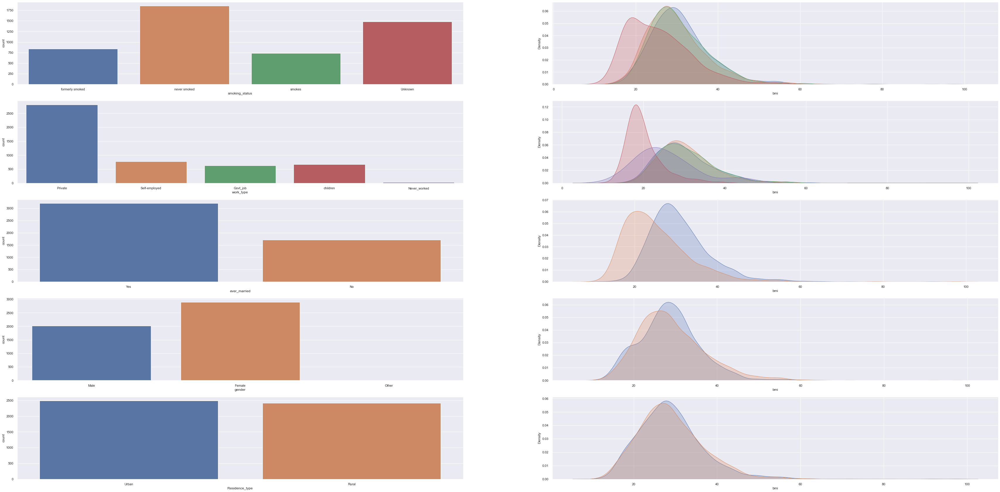

In [824]:
# smoking_statu x bmi

plt.figure(figsize=(60,30))

plt.subplot(5,2,1)
sns.countplot(df3['smoking_status'])

plt.subplot(5,2,2)
sns.kdeplot(df3[df3['smoking_status'] == 'formerly smoked']['bmi'], label='formerly smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'never smoked']['bmi'], label='never smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'smokes']['bmi'], label='smokes', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'Unknown']['bmi'], label='unknown', shade=True)

# work_type x bmi
plt.subplot(5,2,3)
sns.countplot(df3['work_type'])

plt.subplot(5,2,4)
sns.kdeplot(df3[df3['work_type'] == 'Private']['bmi'], label='Private', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Self-employed']['bmi'], label='Self-employed', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Govt_job']['bmi'], label='Govt_job', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'children']['bmi'], label='children', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Never_worked']['bmi'], label='Never_worked', shade=True)

# ever_married x bmi
plt.subplot(5,2,5)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,6)
sns.kdeplot(df3[df3['ever_married'] == 'Yes']['bmi'], label='Yes', shade=True)
sns.kdeplot(df3[df3['ever_married'] == 'No']['bmi'], label='No', shade=True)

# ever_married x bmi
plt.subplot(5,2,7)
sns.countplot(df3['gender'])

plt.subplot(5,2,8)
sns.kdeplot(df3[df3['gender'] == 'Male']['bmi'], label='Male', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Female']['bmi'], label='Female', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Other']['bmi'], label='Other', shade=True)

# ever_married x bmi
plt.subplot(5,2,9)
sns.countplot(df3['Residence_type'])

plt.subplot(5,2,10)
sns.kdeplot(df3[df3['Residence_type'] == 'Rural']['bmi'], label='Rural', shade=True)
sns.kdeplot(df3[df3['Residence_type'] == 'Urban']['bmi'], label='Urban', shade=True)

c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\li

<AxesSubplot:xlabel='avg_glucose_level', ylabel='Density'>

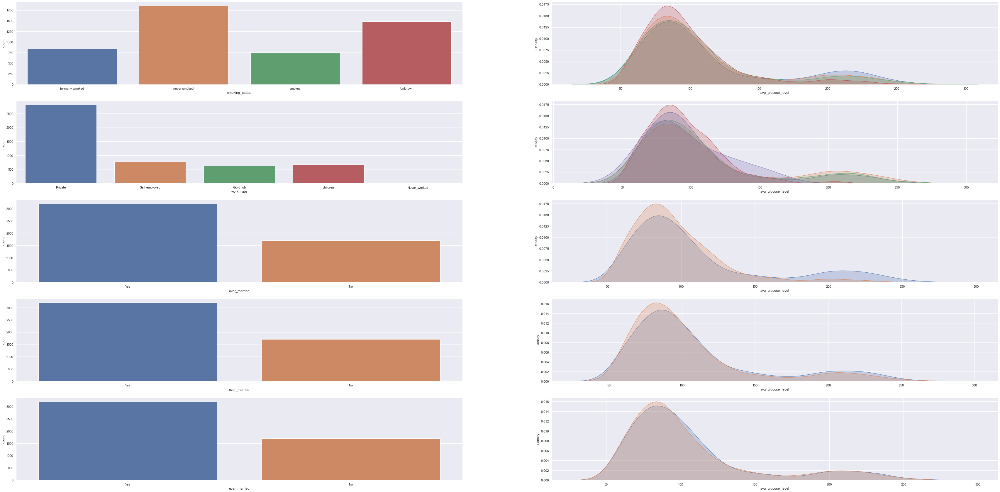

In [386]:
# smoking_statu x avg_glucose_level

plt.figure(figsize=(60,30))

plt.subplot(5,2,1)
sns.countplot(df3['smoking_status'])

plt.subplot(5,2,2)
sns.kdeplot(df3[df3['smoking_status'] == 'formerly smoked']['avg_glucose_level'], label='formerly smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'never smoked']['avg_glucose_level'], label='never smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'smokes']['avg_glucose_level'], label='smokes', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'Unknown']['avg_glucose_level'], label='unknown', shade=True)

# work_type x avg_glucose_level
plt.subplot(5,2,3)
sns.countplot(df3['work_type'])

plt.subplot(5,2,4)
sns.kdeplot(df3[df3['work_type'] == 'Private']['avg_glucose_level'], label='Private', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Self-employed']['avg_glucose_level'], label='Self-employed', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Govt_job']['avg_glucose_level'], label='Govt_job', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'children']['avg_glucose_level'], label='children', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Never_worked']['avg_glucose_level'], label='Never_worked', shade=True)

# ever_married x avg_glucose_level
plt.subplot(5,2,5)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,6)
sns.kdeplot(df3[df3['ever_married'] == 'Yes']['avg_glucose_level'], label='Yes', shade=True)
sns.kdeplot(df3[df3['ever_married'] == 'No']['avg_glucose_level'], label='No', shade=True)

# ever_married x avg_glucose_level
plt.subplot(5,2,7)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,8)
sns.kdeplot(df3[df3['gender'] == 'Male']['avg_glucose_level'], label='Male', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Female']['avg_glucose_level'], label='Female', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Other']['avg_glucose_level'], label='Other', shade=True)

# ever_married x avg_glucose_level
plt.subplot(5,2,9)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,10)
sns.kdeplot(df3[df3['Residence_type'] == 'Rural']['avg_glucose_level'], label='Rural', shade=True)
sns.kdeplot(df3[df3['Residence_type'] == 'Urban']['avg_glucose_level'], label='Urban', shade=True)

# gender	ever_married	work_type	Residence_type	smoking_status

The numerical feature 'avg_glucose_level' doesn´t seem to vary much, as a function of categorical variables in the dataset. However a significant difference is seen in the higher values of glucose in people who are positive for 'ever_married', as well as for those who are in 'gov_jobs' and 'self_enployed' for the 'work_type' variable.

### Numerical x Numerical

<AxesSubplot:xlabel='bmi', ylabel='avg_glucose_level'>

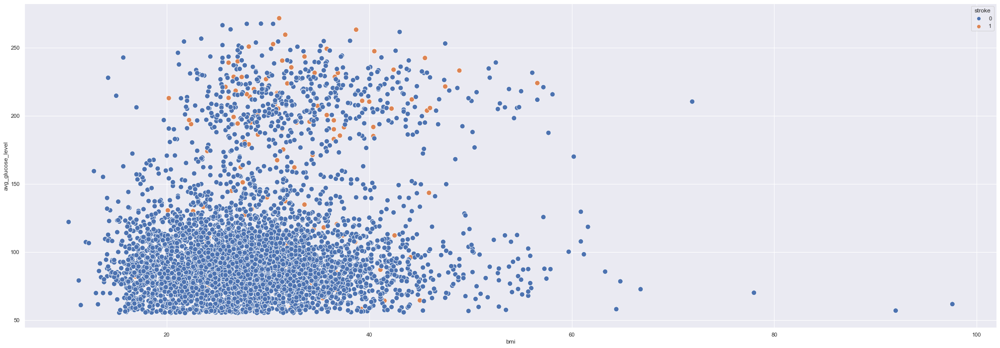

In [436]:
sns.scatterplot(x='bmi', y='avg_glucose_level', data=df3, hue='stroke', s=100)

The above scatter plot shows how stroke incidents tend to accumulate in higher values of the feature 'avg_glucose_level' but also, to a smaller extent, to higher values in the 'bmi' feature.

<AxesSubplot:xlabel='age', ylabel='avg_glucose_level'>

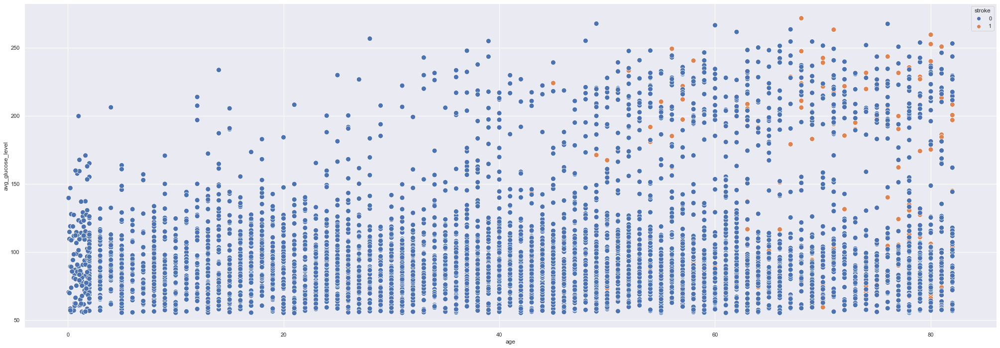

In [551]:
sns.scatterplot(x='age', y='avg_glucose_level', data=df3, hue='stroke', s=100)

<AxesSubplot:xlabel='age', ylabel='bmi'>

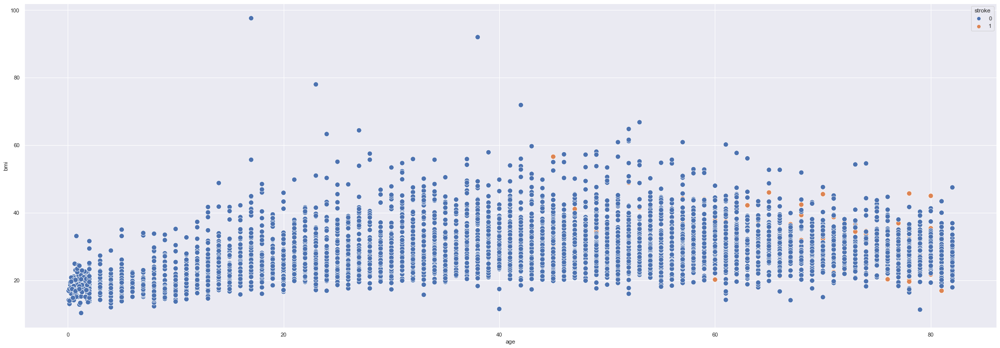

In [552]:
sns.scatterplot(x='age', y='bmi', data=df3, hue='stroke', s=100)

In [564]:
viz_num = df3.copy()
mms = MinMaxScaler()

viz_num['age'] = mms.fit_transform(df3['age'].values.reshape(-1,1))
viz_num['avg_glucose_level'] = mms.fit_transform(df3['avg_glucose_level'].values.reshape(-1,1))
viz_num['bmi'] = mms.fit_transform(df3['bmi'].values.reshape(-1,1))

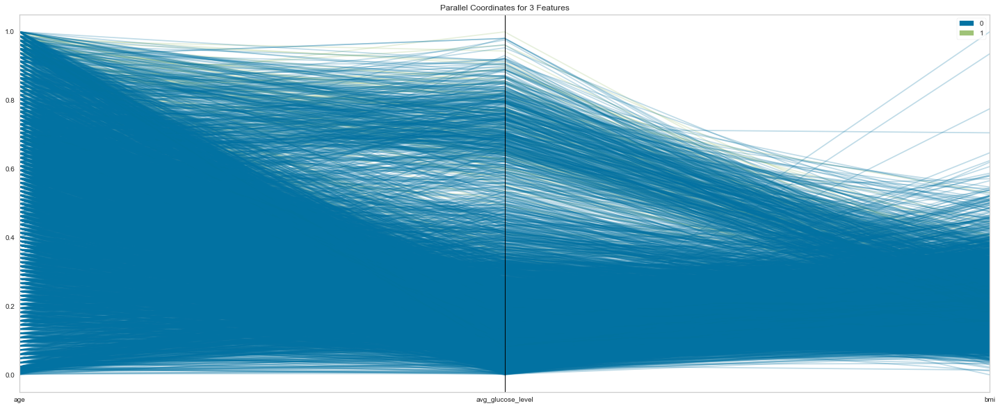

<AxesSubplot:title={'center':'Parallel Coordinates for 3 Features'}>

In [568]:
x = viz_num[['age','avg_glucose_level','bmi']]
y = viz_num['stroke']

plt.rcParams['figure.figsize'] = (25, 10)
viz = ParallelCoordinates()
viz.fit(x,y)
viz.transform(x)
viz.show()

### Numerical x Response

## 3.3. Multivariate

In [71]:
num_attributes = df3.select_dtypes(include=['int64', 'float64'])
cat_attributes = df3.select_dtypes(exclude=['int64', 'float64'])

### Numerical Variables

<AxesSubplot:>

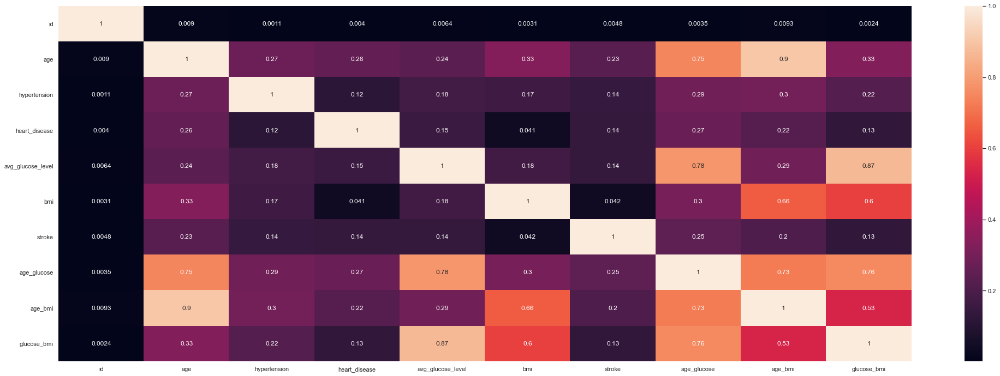

In [74]:
corr = num_attributes.corr(method='pearson')
sns.heatmap(corr, annot=True)

### Categorical Variables - Cramer´s V

In [77]:
a1 = cramer_v(cat_attributes['gender'], cat_attributes['gender'])
a2 = cramer_v(cat_attributes['gender'], cat_attributes['ever_married'])
a3 = cramer_v(cat_attributes['gender'], cat_attributes['work_type'])
a4 = cramer_v(cat_attributes['gender'], cat_attributes['Residence_type'])
a5 = cramer_v(cat_attributes['gender'], cat_attributes['smoking_status'])

a6 = cramer_v(cat_attributes['ever_married'], cat_attributes['gender'])
a7 = cramer_v(cat_attributes['ever_married'], cat_attributes['ever_married'])
a8 = cramer_v(cat_attributes['ever_married'], cat_attributes['work_type'])
a9 = cramer_v(cat_attributes['ever_married'], cat_attributes['Residence_type'])
a10 = cramer_v(cat_attributes['ever_married'], cat_attributes['smoking_status'])

a11 = cramer_v(cat_attributes['work_type'], cat_attributes['gender'])
a12 = cramer_v(cat_attributes['work_type'], cat_attributes['ever_married'])
a13 = cramer_v(cat_attributes['work_type'], cat_attributes['work_type'])
a14 = cramer_v(cat_attributes['work_type'], cat_attributes['Residence_type'])
a15 = cramer_v(cat_attributes['work_type'], cat_attributes['smoking_status'])

a16 = cramer_v(cat_attributes['Residence_type'], cat_attributes['gender'])
a17 = cramer_v(cat_attributes['Residence_type'], cat_attributes['ever_married'])
a18 = cramer_v(cat_attributes['Residence_type'], cat_attributes['work_type'])
a19 = cramer_v(cat_attributes['Residence_type'], cat_attributes['Residence_type'])
a20 = cramer_v(cat_attributes['Residence_type'], cat_attributes['smoking_status'])

a21 = cramer_v(cat_attributes['smoking_status'], cat_attributes['gender'])
a22 = cramer_v(cat_attributes['smoking_status'], cat_attributes['ever_married'])
a23 = cramer_v(cat_attributes['smoking_status'], cat_attributes['work_type'])
a24 = cramer_v(cat_attributes['smoking_status'], cat_attributes['Residence_type'])
a25 = cramer_v(cat_attributes['smoking_status'], cat_attributes['smoking_status'])

In [78]:
d = pd.DataFrame({'gender': [a1, a2, a3, a4, a5],
                  'ever_marries' :[a6, a7, a8, a9, a10],
                  'work_type' :[a11, a12, a13, a14, a15],
                  'Residence_type' :[a16, a17, a18, a19, a20],
                  'smoking_status' :[a21, a22, a23, a24, a25]              
                 })
d = d.set_index(d.columns)

<AxesSubplot:>

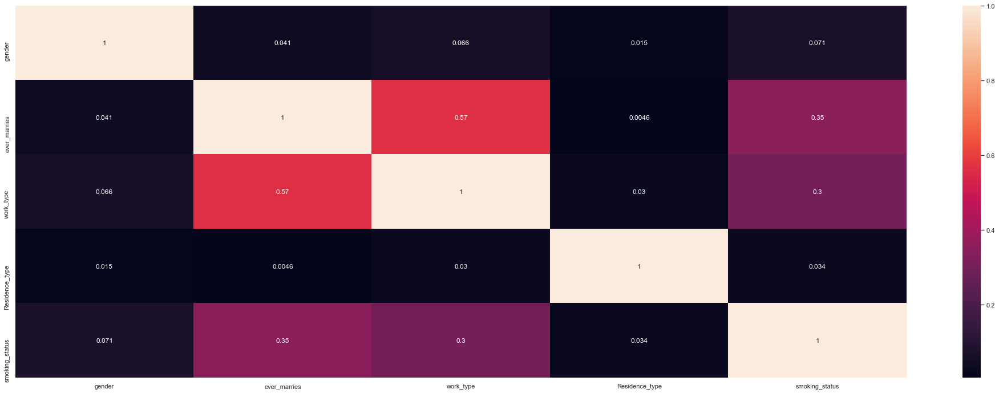

In [80]:
sns.heatmap(d, annot=True)

# 4. Data Preparation

In [72]:
df4 = df3.copy()

In [73]:
df4.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,age_glucose,age_bmi,glucose_bmi
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1,15322.23,2452.2,8370.054
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1,8473.60,2600.0,3442.400
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1,8390.27,1685.6,5890.312
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1,13755.48,1896.0,4178.880
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1,15083.01,2349.0,5400.090


In [74]:
df4.drop(['id'], axis=1, inplace=True)

In [29]:
num_analysis(df4.select_dtypes(include=['int64', 'float64']))

NameError: name 'num_analysis' is not defined

### Normalization

In [30]:
df4['bmi'].unique()

array([36.6,  nan, 32.5, 34.4, 24. , 29. , 27.4, 22.8, 24.2, 29.7, 36.8,
       27.3, 28.2, 30.9, 37.5, 25.8, 37.8, 22.4, 48.9, 26.6, 27.2, 23.5,
       28.3, 44.2, 25.4, 22.2, 30.5, 26.5, 33.7, 23.1, 32. , 29.9, 23.9,
       28.5, 26.4, 20.2, 33.6, 38.6, 39.2, 27.7, 31.4, 36.5, 33.2, 32.8,
       40.4, 25.3, 30.2, 47.5, 20.3, 30. , 28.9, 28.1, 31.1, 21.7, 27. ,
       24.1, 45.9, 44.1, 22.9, 29.1, 32.3, 41.1, 25.6, 29.8, 26.3, 26.2,
       29.4, 24.4, 28. , 28.8, 34.6, 19.4, 30.3, 41.5, 22.6, 56.6, 27.1,
       31.3, 31. , 31.7, 35.8, 28.4, 20.1, 26.7, 38.7, 34.9, 25. , 23.8,
       21.8, 27.5, 24.6, 32.9, 26.1, 31.9, 34.1, 36.9, 37.3, 45.7, 34.2,
       23.6, 22.3, 37.1, 45. , 25.5, 30.8, 37.4, 34.5, 27.9, 29.5, 46. ,
       42.5, 35.5, 26.9, 45.5, 31.5, 33. , 23.4, 30.7, 20.5, 21.5, 40. ,
       28.6, 42.2, 29.6, 35.4, 16.9, 26.8, 39.3, 32.6, 35.9, 21.2, 42.4,
       40.5, 36.7, 29.3, 19.6, 18. , 17.6, 19.1, 50.1, 17.7, 54.6, 35. ,
       22. , 39.4, 19.7, 22.5, 25.2, 41.8, 60.9, 23

In [75]:
ss = StandardScaler()

# the 'normalizer' is used on features that show a gaussian or normal distribution

In [76]:
df4['bmi'].values

array([36.6, 32.5, 34.4, ..., 30.6, 25.6, 26.2])

In [77]:
ss.fit_transform(df4['bmi'].values.reshape(-1,1))

array([[ 0.98134488],
       [ 0.45926914],
       [ 0.70120668],
       ...,
       [ 0.21733161],
       [-0.41934612],
       [-0.34294479]])

In [78]:
df4['bmi'] = ss.fit_transform(df4['bmi'].values.reshape(-1,1))
df4['glucose_bmi'] = ss.fit_transform(df4['glucose_bmi'].values.reshape(-1,1))

In [79]:
df4['bmi'].unique()

array([ 9.81344880e-01,  4.59269144e-01,  7.01206680e-01, -6.23082990e-01,
        1.35947360e-02, -1.90142136e-01, -7.75885644e-01, -5.97615881e-01,
        1.02729618e-01,  1.00681199e+00, -2.02875691e-01, -8.82737001e-02,
        2.55532272e-01,  1.09594687e+00, -3.93879009e-01,  1.13414753e+00,
       -8.26819862e-01,  2.54757209e+00, -2.92010573e-01, -2.15609245e-01,
       -6.86750763e-01, -7.55401456e-02,  1.94909502e+00, -4.44813227e-01,
       -8.52286972e-01,  2.04598054e-01, -3.04744127e-01,  6.12071799e-01,
       -7.37684981e-01,  3.95601372e-01,  1.28196727e-01, -6.35816545e-01,
       -5.00730366e-02, -3.17477682e-01, -1.10695806e+00,  5.99338244e-01,
        1.23601597e+00,  1.31241730e+00, -1.51941473e-01,  3.19200045e-01,
        9.68611325e-01,  5.48404026e-01,  4.97469808e-01,  1.46521995e+00,
       -4.57546781e-01,  1.66397390e-01,  2.36930232e+00, -1.09422451e+00,
        1.40930281e-01,  8.61181524e-04, -1.01007255e-01,  2.80999381e-01,
       -9.15954744e-01, -

c:\users\lucas\miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='bmi', ylabel='Density'>

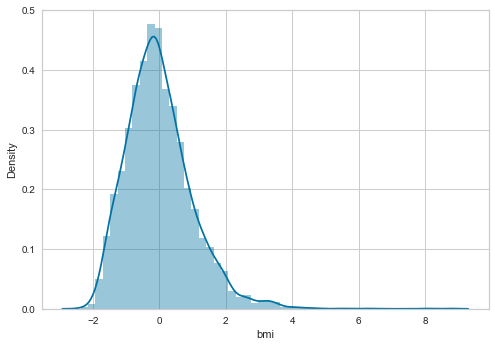

In [80]:
sns.distplot(df4['bmi'])

### Rescaling (MinMax, Robust Scaler)

In [81]:
rs = RobustScaler() 
mms = MinMaxScaler()

c:\users\lucas\miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='age', ylabel='Density'>

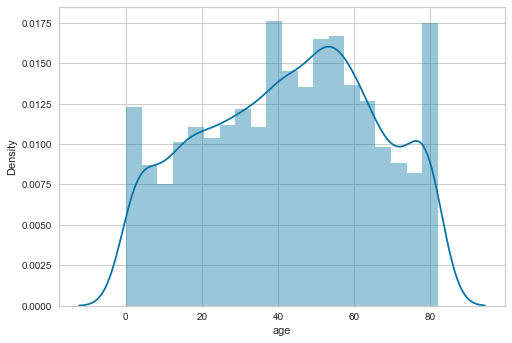

In [82]:
sns.distplot(df4['age'])

In [83]:
mms.fit_transform(df4['age_bmi'].values.reshape(-1,1))

array([[0.60681034],
       [0.64340109],
       [0.41702366],
       ...,
       [0.26486753],
       [0.3229473 ],
       [0.2851187 ]])

In [84]:
df4['age'] = mms.fit_transform(df4['age'].values.reshape(-1,1))
df4['avg_glucose_level'] = rs.fit_transform(df4['avg_glucose_level'].values.reshape(-1,1))
df4['age_glucose'] = rs.fit_transform(df4['age_glucose'].values.reshape(-1,1))
df4['age_bmi'] = mms.fit_transform(df4['age_bmi'].values.reshape(-1,1))

### Transformation 
  - Encoding Categorical Variables
        One Hot Enconding (Dummie)
        Label Encoding
        Ordinal Encoding
        Target Encoding
        Frequency Encoding
        Embedding Encoding

In [85]:
df4.select_dtypes(exclude=['int64', 'float64'])

,gender,ever_married,work_type,Residence_type,smoking_status
0,Male,Yes,Private,Urban,formerly smoked
2,Male,Yes,Private,Rural,never smoked
3,Female,Yes,Private,Urban,smokes
4,Female,Yes,Self-employed,Rural,never smoked
5,Male,Yes,Private,Urban,formerly smoked
...,...,...,...,...,...
5104,Female,No,children,Rural,Unknown
5106,Female,Yes,Self-employed,Urban,never smoked
5107,Female,Yes,Self-employed,Rural,never smoked
5108,Male,Yes,Private,Rural,formerly smoked


In [86]:
df4.select_dtypes(exclude=['int64', 'float64']).apply(lambda x: x.unique().shape)

,gender,ever_married,work_type,Residence_type,smoking_status
0,3,2,5,2,4


In [87]:
pd.get_dummies(df4['work_type'], prefix='work', columns=['work_type'])

,work_Govt_job,work_Never_worked,work_Private,work_Self-employed,work_children
0,0,0,1,0,0
2,0,0,1,0,0
3,0,0,1,0,0
4,0,0,0,1,0
5,0,0,1,0,0
...,...,...,...,...,...
5104,0,0,0,0,1
5106,0,0,0,1,0
5107,0,0,0,1,0
5108,0,0,1,0,0


In [88]:
le = LabelEncoder()

In [89]:
df4['gender'] = le.fit_transform(df4['gender'])
df4['ever_married'] = le.fit_transform(df4['ever_married'])
df4['Residence_type'] = le.fit_transform(df4['Residence_type'])

In [90]:
df4['smoking_status'].unique()

array(['formerly smoked', 'never smoked', 'smokes', 'Unknown'],
      dtype=object)

In [91]:
# Pattern of strokes in this categorical feature leads to this order of encoding

assortment_dict = {'Unknown': 0, 'never smoked': 1, 'smokes': 2, 'formerly smoked': 3}
df4['smoking_status'] = df4['smoking_status'].map(assortment_dict)

In [92]:
df4['smoking_status']

0       3
2       1
3       2
4       1
5       3
       ..
5104    0
5106    1
5107    1
5108    3
5109    0
Name: smoking_status, Length: 4909, dtype: int64

In [93]:
df4 = pd.get_dummies(df4, prefix=['work'], columns=['work_type'])

In [94]:
df4.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'Residence_type', 'avg_glucose_level', 'bmi', 'smoking_status',
       'stroke', 'age_glucose', 'age_bmi', 'glucose_bmi', 'work_Govt_job',
       'work_Never_worked', 'work_Private', 'work_Self-employed',
       'work_children'],
      dtype='object')

In [95]:
df4 = df4[['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'Residence_type', 'avg_glucose_level', 'bmi', 'smoking_status',
       'age_glucose', 'age_bmi', 'glucose_bmi', 'work_Govt_job',
       'work_Never_worked', 'work_Private', 'work_Self-employed',
       'work_children', 'stroke']]

df4.head()

,gender,age,hypertension,heart_disease,ever_married,Residence_type,avg_glucose_level,bmi,smoking_status,age_glucose,age_bmi,glucose_bmi,work_Govt_job,work_Never_worked,work_Private,work_Self-employed,work_children,stroke
0,1,0.816895,0,1,1,1,3.753699,0.981345,3,2.963209,0.606810,2.929269,0,0,1,0,0,1
2,1,0.975586,0,1,1,0,0.390137,0.459269,1,1.185272,0.643401,0.188326,0,0,1,0,0,1
3,0,0.597168,0,0,1,1,2.179452,0.701207,2,1.163639,0.417024,1.549945,0,0,1,0,0,1
4,0,0.963379,1,0,1,0,2.258630,-0.623083,1,2.556473,0.469112,0.597983,0,0,0,1,0,1
5,1,0.987793,0,0,1,1,2.589863,0.013595,3,2.901106,0.581261,1.277265,0,0,1,0,0,1


# 5. Balancing Response Variable

In [96]:
df5 = df4.copy()

In [97]:
# train and test split
X = df5.drop('stroke', axis=1)
y = df5['stroke']

x_train_imb, x_test, y_train_imb, y_test = ms.train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

In [98]:
# ratio balanced
ratio = {0: 4700,
         1: 4700}

# define sampler
smt = c.SMOTETomek(sampling_strategy=ratio, random_state=32, n_jobs=-1)

# apply sampler
X_smt, y_smt = smt.fit_resample(x_train_imb, y_train_imb)

c:\users\lucas\miniconda3\lib\site-packages\imblearn\utils\_validation.py:318: UserWarning: After over-sampling, the number of samples (4700) in class 0 will be larger than the number of samples in the majority class (class #0 -> 3290)
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\imblearn\utils\_validation.py:318: UserWarning: After over-sampling, the number of samples (4700) in class 1 will be larger than the number of samples in the majority class (class #0 -> 3290)
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\imblearn\utils\_validation.py:318: UserWarning: After over-sampling, the number of samples (4700) in class 0 will be larger than the number of samples in the majority class (class #0 -> 3290)
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\imblearn\utils\_validation.py:318: UserWarning: After over-sampling, the number of samples (4700) in class 1 will be larger than the number of samples in the majority class (class #0 -> 3290)
  war

NameError: name 'y_train' is not defined

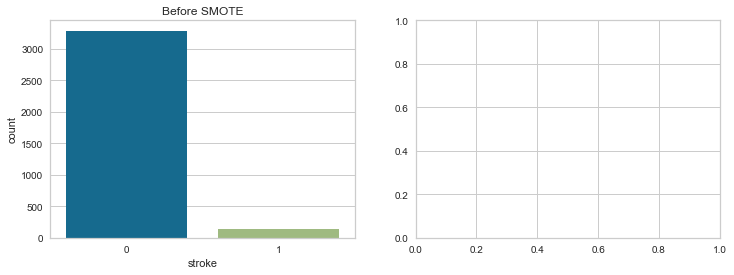

In [99]:
 #Plot Before and after
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
sns.countplot(x=y_train_imb).set_title('Before SMOTE')

plt.subplot(1,2,2)
sns.countplot(x=y_train).set_title('After SMOTE') ;

# 6. Feature Selection

In [932]:
# concat train df
df6 = pd.concat([X_smt, y_smt], axis=1)
df6

,gender,age,hypertension,heart_disease,ever_married,Residence_type,avg_glucose_level,bmi,smoking_status,age_glucose,age_bmi,glucose_bmi,work_Govt_job,work_Never_worked,work_Private,work_Self-employed,work_children,stroke
0,1,0.633789,0,0,1,1,4.274247,0.790342,0,2.329163,0.451584,3.109415,0,0,1,0,0,0
1,1,0.021973,0,0,0,1,0.547123,-1.603567,0,-0.960023,0.007307,-0.714171,0,0,0,0,1,0
2,0,0.853516,1,0,1,1,0.216986,0.688473,3,0.795450,0.594135,0.173797,0,0,0,1,0,0
3,0,0.548340,0,0,1,1,0.504658,0.255532,1,0.271697,0.343966,0.165904,0,0,0,1,0,0
4,1,0.377441,0,0,1,0,0.238630,1.032279,1,-0.206601,0.283683,0.339639,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9387,0,0.942999,1,0,0,0,-0.329846,-0.506908,3,0.590373,0.478754,-0.618446,0,0,1,0,0,1
9388,0,0.926289,0,0,1,0,2.878928,-0.180973,1,2.824015,0.516443,1.279733,0,0,1,0,0,1
9389,1,0.892058,0,1,1,1,4.065526,0.613443,3,3.565146,0.605380,2.754834,0,0,0,0,0,1
9390,1,0.738656,0,0,1,0,3.908953,0.055290,1,2.667932,0.438408,2.103283,0,0,1,0,0,1


In [3]:
df6.to_csv(r'C:\Users\lucas\Desktop\Comunidade DS\Projetos menores\stroke_prediction\data\interim\df6.csv')

NameError: name 'df6' is not defined

## Boruta

In [944]:
# boruta algorithm
x_train_n = df6.drop(['stroke'], axis=1).values
y_train_n = df6['stroke'].values

# define model 
et = en.ExtraTreesClassifier(n_jobs=-1)

# Define Boruta
boruta = bt.BorutaPy(et, n_estimators='auto', verbose=2, random_state=42).fit(x_train_n, y_train_n)

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	9 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	10 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	11 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	12 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	13 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	14 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	15 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
Iteration: 	16 / 100
Confirmed: 	14
Tentative: 	1
Rejected: 	2
I

In [946]:
boruta.support_.tolist()

[True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 False]

In [947]:
# best features according to boruta
cols_sel_boruta = df6.drop(['stroke'], axis=1).iloc[:, cols_selected].columns.tolist()
cols_sel_boruta

['gender',
 'age',
 'hypertension',
 'ever_married',
 'Residence_type',
 'avg_glucose_level',
 'bmi',
 'smoking_status',
 'age_glucose',
 'age_bmi',
 'glucose_bmi',
 'work_Govt_job',
 'work_Private',
 'work_Self-employed']

In [949]:
# np.setdiff1d - Find the set difference of two arrays. Return the unique values in ar1 that are not in ar2.
cols_not_selected_boruta = list(np.setdiff1d(df6.drop(['stroke'], axis=1).columns, cols_sel_boruta))
cols_not_selected_boruta

['heart_disease', 'work_Never_worked', 'work_children']

## Feature Importance

In [951]:
# feature importance
forest = en.ExtraTreesClassifier(n_estimators=250, random_state=0, n_jobs=-1)

# data preparation
x_train_n = df6.drop(['stroke'], axis=1)
y_train_n = df6['stroke'].values
forest.fit(x_train_n, y_train_n)

ExtraTreesClassifier(n_estimators=250, n_jobs=-1, random_state=0)

In [952]:
# plotting importance results
importances = forest.feature_importances_
indices = np.argsort(importances)[::-1]

# print the feature ranking
print('Feature ranking:')
df = pd.DataFrame()
for i, j in zip(x_train_n, forest.feature_importances_):
    aux = pd.DataFrame({'feature': i, 'importance': j}, index=[0])
    df= pd.concat([df, aux], axis=0)
    
print(df.sort_values('importance', ascending=False))

Feature ranking:
              feature  importance
0                 age    0.241549
0             age_bmi    0.131084
0         age_glucose    0.127517
0   avg_glucose_level    0.083533
0         glucose_bmi    0.068371
0      smoking_status    0.065945
0                 bmi    0.065753
0      Residence_type    0.034338
0              gender    0.029784
0  work_Self-employed    0.027545
0        ever_married    0.026653
0       work_Govt_job    0.026403
0        work_Private    0.023325
0        hypertension    0.019924
0       work_children    0.014790
0       heart_disease    0.013396
0   work_Never_worked    0.000091


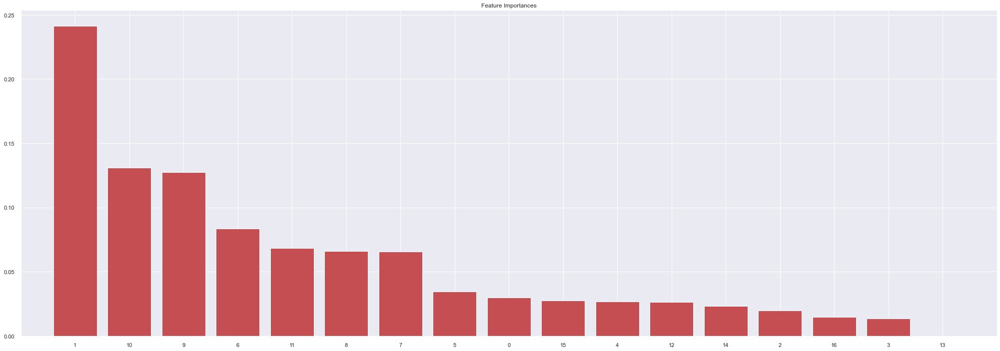

In [953]:
# plot the impurity-base feature importance of the forest
plt.figure()
plt.title('Feature Importances')
plt.bar(range(x_train_n.shape[1]), importances[indices], color='r', align='center')
plt.xticks(range(x_train_n.shape[1]), indices)
plt.xlim([-1, x_train_n.shape[1]])
plt.show()

In [ ]:
# boruta: ['gender', 'age', 'ever_married', 'avg_glucose_level', 'bmi', 'smoking_status', 'age_glucose', 'age_bmi', 'glucose_bmi']

# importance:  ['age',   'age_bmi',  'age_glucose', 'avg_glucose_level' ,   'glucose_bmi',    'bmi',    'smoking_status' ]  

In [954]:
cols_sel_boruta

['gender',
 'age',
 'hypertension',
 'ever_married',
 'Residence_type',
 'avg_glucose_level',
 'bmi',
 'smoking_status',
 'age_glucose',
 'age_bmi',
 'glucose_bmi',
 'work_Govt_job',
 'work_Private',
 'work_Self-employed']

In [956]:
cols_sel_importance = [ 'age', 'age_bmi', 'age_glucose', 'avg_glucose_level', 'glucose_bmi', 'smoking_status',  'bmi' ]
cols_sel_importance

['age',
 'age_bmi',
 'age_glucose',
 'avg_glucose_level',
 'glucose_bmi',
 'smoking_status',
 'bmi']

# 7. ML Models

In [960]:
# cols_boruta
x_train_boruta = df6.drop(['stroke'], axis=1)[cols_sel_boruta]
y_train_boruta = df6['stroke'].values

x_test_boruta = x_test[cols_sel_boruta]
y_test_boruta = y_test

# cols_importance
x_train_importance = df6.drop(['stroke'], axis=1)[cols_sel_importance]
y_train_importance = df6['stroke'].values

x_test_importance = x_test[cols_sel_importance]
y_test_importance = y_test

## 7.1. Logistic Regression

### Cols_boruta

In [961]:
## Logistic Regression
# model definition
lr_model = lm.LogisticRegression(random_state=42)

# model training
lr_model.fit(x_train_boruta, y_train_boruta)

# predict
y_hat = lr_model.predict(x_test_boruta)

print(m.confusion_matrix(y_test, y_hat))

print(m.classification_report(y_test, y_hat))

[[1113  297]
 [  20   43]]
              precision    recall  f1-score   support

           0       0.98      0.79      0.88      1410
           1       0.13      0.68      0.21        63

    accuracy                           0.78      1473
   macro avg       0.55      0.74      0.54      1473
weighted avg       0.95      0.78      0.85      1473



### Cols_importance

In [962]:
## Logistic Regression
# model definition
lr_model = lm.LogisticRegression(random_state=42)

# model training
lr_model.fit(x_train_importance, y_train_importance)

# predict
y_hat = lr_model.predict(x_test_importance)

print(m.confusion_matrix(y_test, y_hat))

print(m.classification_report(y_test, y_hat))

[[1069  341]
 [  16   47]]
              precision    recall  f1-score   support

           0       0.99      0.76      0.86      1410
           1       0.12      0.75      0.21        63

    accuracy                           0.76      1473
   macro avg       0.55      0.75      0.53      1473
weighted avg       0.95      0.76      0.83      1473



## 7.2. KNN

### Cols_boruta

Text(0, 0.5, 'Error Rate')

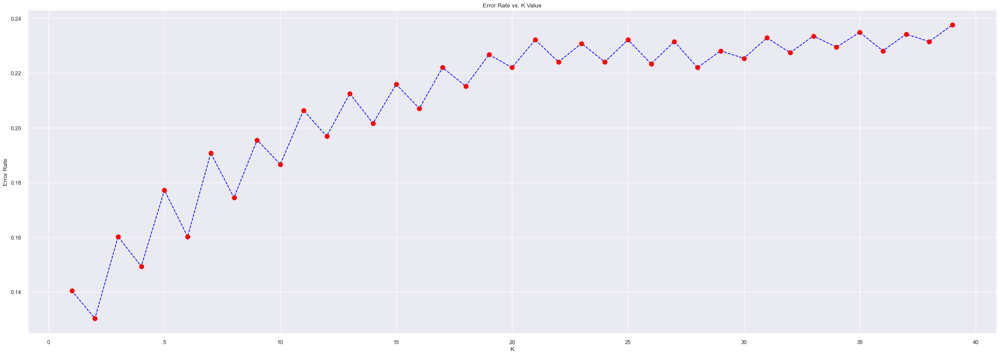

In [964]:
error_rate = []

# iterate over increasing n_neighbors:
for i in range(1,40):
    
    knn = nh.KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train_boruta, y_train_boruta)
    pred_i = knn.predict(x_test_boruta)
    error_rate.append(np.mean(pred_i != y_test))

plt.plot(range(1,40), error_rate, color='blue', linestyle='dashed', marker='o', 
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [970]:
# KNN -----> n_neighbors = 1
# model definition
knn_model = nh.KNeighborsClassifier(n_neighbors=2)

# model training
knn_model.fit(x_train_boruta, y_train_boruta)

# predict
y_hat = knn_model.predict(x_test_boruta)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1272  138]
 [  54    9]]
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      1410
           1       0.06      0.14      0.09        63

    accuracy                           0.87      1473
   macro avg       0.51      0.52      0.51      1473
weighted avg       0.92      0.87      0.89      1473



### Cols_importance

Text(0, 0.5, 'Error Rate')

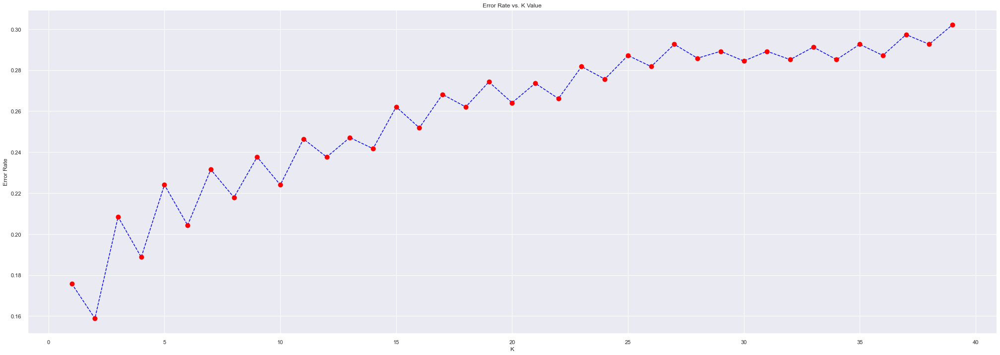

In [967]:
error_rate = []

# iterate over increasing n_neighbors:
for i in range(1,40):
    
    knn = nh.KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train_importance, y_train_importance)
    pred_i = knn.predict(x_test_importance)
    error_rate.append(np.mean(pred_i != y_test))

plt.plot(range(1,40), error_rate, color='blue', linestyle='dashed', marker='o', 
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [969]:
# KNN -----> n_neighbors = 1
# model definition
knn_model = nh.KNeighborsClassifier(n_neighbors=2)

# model training
knn_model.fit(x_train_importance, y_train_importance)

# predict
y_hat = knn_model.predict(x_test_importance)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1217  193]
 [  41   22]]
              precision    recall  f1-score   support

           0       0.97      0.86      0.91      1410
           1       0.10      0.35      0.16        63

    accuracy                           0.84      1473
   macro avg       0.53      0.61      0.54      1473
weighted avg       0.93      0.84      0.88      1473



## 7.3. SVM

### Cols_boruta

In [982]:
# SVM
# model definition
svm_model = svm.LinearSVC()

# model training
svm_model.fit(x_train_boruta, y_train_boruta)

# predict
y_hat = svm_model.predict(x_test_boruta)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1108  302]
 [  19   44]]
              precision    recall  f1-score   support

           0       0.98      0.79      0.87      1410
           1       0.13      0.70      0.22        63

    accuracy                           0.78      1473
   macro avg       0.56      0.74      0.54      1473
weighted avg       0.95      0.78      0.85      1473



c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


### Cols_importance

In [983]:
# SVM
# model definition
svm_model = svm.LinearSVC()

# model training
svm_model.fit(x_train_importance, y_train_importance)

# predict
y_hat = svm_model.predict(x_test_importance)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1049  361]
 [  15   48]]
              precision    recall  f1-score   support

           0       0.99      0.74      0.85      1410
           1       0.12      0.76      0.20        63

    accuracy                           0.74      1473
   macro avg       0.55      0.75      0.53      1473
weighted avg       0.95      0.74      0.82      1473



c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


## 7.4. Decision Tree Classifier

### Cols_boruta

In [986]:
# Decision Tree Classifier
# model definition
dt_model = tree.DecisionTreeClassifier()

# model training
dt_model.fit(x_train_boruta, y_train_boruta)

# predict
y_hat = dt_model.predict(x_test_boruta)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1269  141]
 [  56    7]]
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      1410
           1       0.05      0.11      0.07        63

    accuracy                           0.87      1473
   macro avg       0.50      0.51      0.50      1473
weighted avg       0.92      0.87      0.89      1473



### Cols_importance

In [1018]:
# Decision Tree Classifier
# model definition
dt_model = tree.DecisionTreeClassifier()

# model training
dt_model.fit(x_train_importance, y_train_importance)

# predict
y_hat = dt_model.predict(x_test_importance)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1220  190]
 [  46   17]]
              precision    recall  f1-score   support

           0       0.96      0.87      0.91      1410
           1       0.08      0.27      0.13        63

    accuracy                           0.84      1473
   macro avg       0.52      0.57      0.52      1473
weighted avg       0.93      0.84      0.88      1473



## 7.5. Random Forest Classifier

### Cols_boruta

In [989]:
# Ensemble Methods - Random Forest
# model definition
rf_model = en.RandomForestClassifier()

# model training
rf_model.fit(x_train_boruta, y_train_boruta)

# predict
y_hat = rf_model.predict(x_test_boruta)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1309  101]
 [  52   11]]
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1410
           1       0.10      0.17      0.13        63

    accuracy                           0.90      1473
   macro avg       0.53      0.55      0.54      1473
weighted avg       0.92      0.90      0.91      1473



### Cols_importance

In [988]:
# Ensemble Methods - Random Forest
# model definition
rf_model = en.RandomForestClassifier()

# model training
rf_model.fit(x_train_importance, y_train_importance)

# predict
y_hat = rf_model.predict(x_test_importance)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1214  196]
 [  42   21]]
              precision    recall  f1-score   support

           0       0.97      0.86      0.91      1410
           1       0.10      0.33      0.15        63

    accuracy                           0.84      1473
   macro avg       0.53      0.60      0.53      1473
weighted avg       0.93      0.84      0.88      1473



## 7.6. XGBoost Classifier

### Cols_boruta

In [992]:
# Gradient boosting - XGBoost
# model definition
xgb_model = XGBClassifier()

# model training
xgb_model.fit(x_train_boruta, y_train_boruta)

# predict
y_hat = xgb_model.predict(x_test_boruta)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1320   90]
 [  59    4]]
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1410
           1       0.04      0.06      0.05        63

    accuracy                           0.90      1473
   macro avg       0.50      0.50      0.50      1473
weighted avg       0.92      0.90      0.91      1473



### Cols_importance

In [991]:
# Gradient boosting - XGBoost
# model definition
xgb_model = XGBClassifier()

# model training
xgb_model.fit(x_train_importance, y_train_importance)

# predict
y_hat = xgb_model.predict(x_test_importance)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1306  104]
 [  51   12]]
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1410
           1       0.10      0.19      0.13        63

    accuracy                           0.89      1473
   macro avg       0.53      0.56      0.54      1473
weighted avg       0.93      0.89      0.91      1473



## 6.7. CatBoost Classifier

### Cols_boruta

In [996]:
# Gradient boosting - CatBoost
# model definition
cat_model = CatBoostClassifier(verbose=False)

# model training
cat_model.fit(x_train_boruta, y_train_boruta)

# predict
y_hat = cat_model.predict(x_test_boruta)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1304  106]
 [  55    8]]
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      1410
           1       0.07      0.13      0.09        63

    accuracy                           0.89      1473
   macro avg       0.51      0.53      0.52      1473
weighted avg       0.92      0.89      0.91      1473



### Cols_importance

In [1028]:
# Gradient boosting - CatBoost
# model definition
cat_model = CatBoostClassifier(verbose=False)

# model training
cat_model.fit(x_train_importance, y_train_importance)

# predict
y_hat = cat_model.predict(x_test_importance)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[1233  177]
 [  45   18]]
              precision    recall  f1-score   support

           0       0.96      0.87      0.92      1410
           1       0.09      0.29      0.14        63

    accuracy                           0.85      1473
   macro avg       0.53      0.58      0.53      1473
weighted avg       0.93      0.85      0.88      1473



# 8. Compare Models Performance - Cross-Validation

In [1090]:
classifiers = [['Logistic Regression', lm.LogisticRegression(verbose=0)],
               ['KNN', nh.KNeighborsClassifier(n_neighbors=2)],
               ['SVM', svm.LinearSVC()],
               ['Decision Tree', tree.DecisionTreeClassifier()],
               ['Random Forest Classifier', en.RandomForestClassifier()],
               ['XGBoost Classifier', XGBClassifier(verbosity=0)],
               ['CatBoost Classifier', CatBoostClassifier(verbose=False)]]

In [1092]:
# boruta
cv_performance_models(df6[['gender', 'age', 'hypertension', 'ever_married', 'Residence_type',
                           'avg_glucose_level', 'bmi', 'smoking_status', 'age_glucose',
                           'age_bmi', 'glucose_bmi', 'work_Govt_job','work_Private',
                           'work_Self-employed', 'stroke']], classifiers)

c:\users\lucas\miniconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\lucas\miniconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,Logistic Regression,0.753+-0.031,0.765+-0.03,0.787+-0.047,0.59+-0.406,0.575+-0.316
0,KNN,0.944+-0.02,0.945+-0.019,0.944+-0.017,0.725+-0.325,0.777+-0.24
0,SVM,0.754+-0.033,0.773+-0.027,0.803+-0.047,0.59+-0.406,0.579+-0.32
0,Decision Tree,0.9+-0.018,0.876+-0.047,0.852+-0.082,0.664+-0.369,0.697+-0.296
0,Random Forest Classifier,0.944+-0.026,0.951+-0.018,0.962+-0.017,0.706+-0.331,0.767+-0.254
0,XGBoost Classifier,0.93+-0.036,0.924+-0.04,0.933+-0.056,0.676+-0.32,0.746+-0.254
0,CatBoost Classifier,0.929+-0.038,0.935+-0.035,0.953+-0.037,0.669+-0.343,0.736+-0.276


In [1091]:
# importance
cv_performance_models(df6[['age', 'age_bmi', 'age_glucose', 'avg_glucose_level', 'glucose_bmi', 'smoking_status',  'bmi', 'stroke']], classifiers)

c:\users\lucas\miniconda3\lib\site-packages\sklearn\metrics\_classification.py:1814: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')
c:\users\lucas\miniconda3\lib\site-packages\sklearn\metrics\_classification.py:1814: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')
c:\users\lucas\miniconda3\lib\site-packages\sklearn\metrics\_classification.py:1814: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')
c:\users\lucas\miniconda3\lib\site-packages\sklearn\metrics\_classification.py:1814: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')
c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\lucas\

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,Logistic Regression,0.717+-0.035,0.753+-0.034,0.8+-0.075,0.579+-0.408,0.557+-0.313
0,KNN,0.866+-0.041,0.885+-0.055,0.902+-0.076,0.684+-0.353,0.702+-0.245
0,SVM,0.719+-0.041,0.763+-0.022,0.821+-0.071,0.577+-0.408,0.562+-0.318
0,Decision Tree,0.845+-0.017,0.83+-0.027,0.824+-0.062,0.627+-0.377,0.647+-0.297
0,Random Forest Classifier,0.886+-0.033,0.911+-0.01,0.944+-0.029,0.652+-0.374,0.695+-0.3
0,XGBoost Classifier,0.886+-0.041,0.894+-0.035,0.925+-0.042,0.629+-0.353,0.69+-0.285
0,CatBoost Classifier,0.865+-0.05,0.892+-0.028,0.941+-0.023,0.614+-0.378,0.666+-0.315


The performance metric ideal for a disease prediction problem is often 'Recall', since we want to detect each of the positive cases of stroke, even if it is at the expense of detecting as positive the person who do not have a chance of having a stroke, and in this case the models which performed best are: KNN, Random Forest, XGBoost and CatBoost.

# 9. Metrics Evaluation

Now, the out of the box performance of the Machine Learning models are going to be compared before fine tuning.

### 9.1. Confusion matrix
The confusion matrix shows the actual number of the True Class and the Predicted Class for comparison.
* Conclusion: best model is the one with least False Positive cases, in this case CatBoost Classifier.

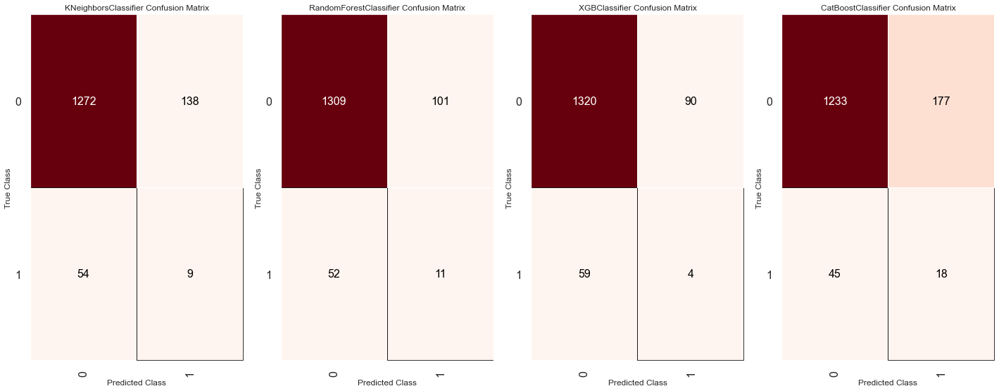

In [1033]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 8))
plt.rcParams['font.size'] = '16'

viz = ConfusionMatrix((knn_model),classes=['0','1'],ax=ax1, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ConfusionMatrix((rf_model),classes=['0','1'],ax=ax2, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ConfusionMatrix(xgb_model, classes=['0','1'], ax=ax3, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ConfusionMatrix(wrap(cat_model), classes=['0','1'], ax=ax4, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

### 9.2. Classification Report
 The classification report shows the Precision, Recall and F1 score (harmonic mean between precision and recall).
 
 * Conclusion: XGBoost performed slightly better on metrics, specifically Recall (0.0956).

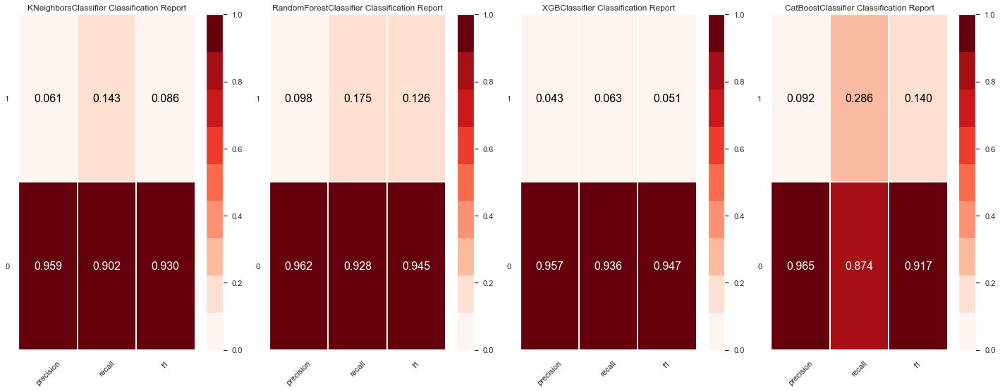

In [1034]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 8))
plt.rcParams['font.size'] = '16'

viz = ClassificationReport((knn_model),classes=['0','1'],ax=ax1, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ClassificationReport((rf_model),classes=['0','1'],ax=ax2, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ClassificationReport(xgb_model, classes=['0','1'], ax=ax3, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ClassificationReport(wrap(cat_model), classes=['0','1'], ax=ax4, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

### 9.3. ROC AUC Curve
 The Receiver Operating Characteristic Curve shows the performance of a model at all classification thresholds. The Area Under the Curve shows how much the algorithm is capable of distinguishing between classes
 * Conclusion: RandomForest and CatBoost have the highest areas under the curve. In Random Forest, False Positive rate starts to appear gradually as in CatBoost there are abrupt changes between the FP and TP., but the curve if more abrupt, guaranteeing an equal area under the curve.

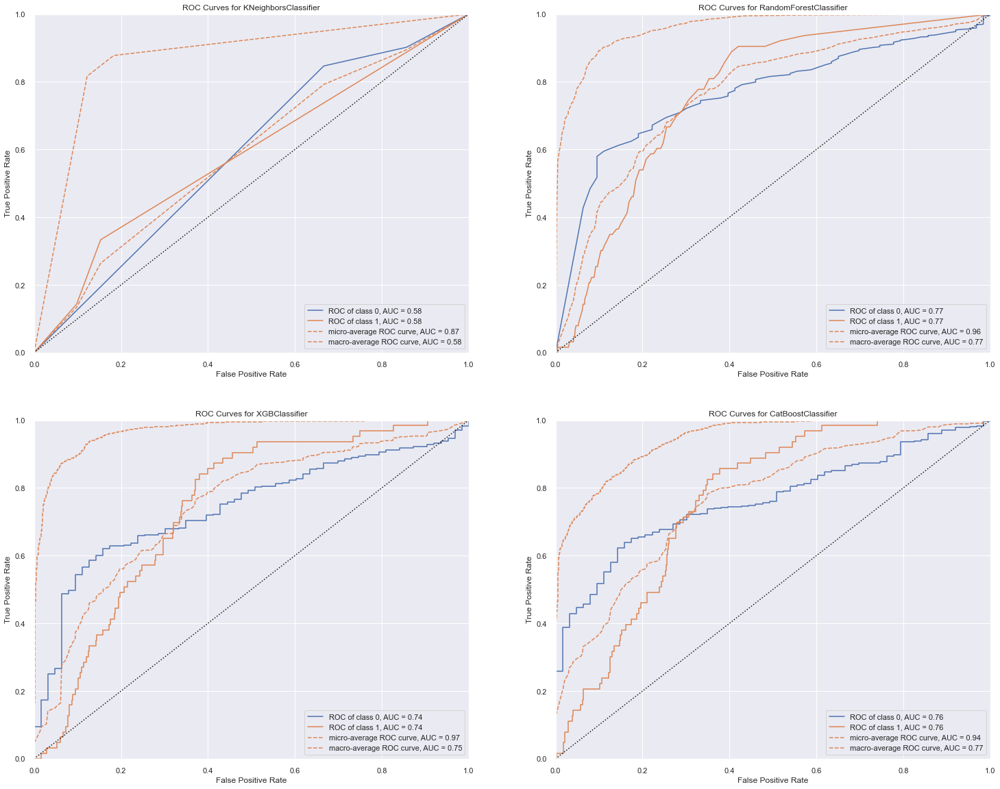

In [1035]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(25, 20))

viz = ROCAUC((knn_model), iso_f1_curves=True, classes=['0','1'],ax=ax1, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ROCAUC((rf_model), iso_f1_curves=True, classes=['0','1'],ax=ax2, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ROCAUC(xgb_model,iso_f1_curves=True, classes=['0','1'], ax=ax3, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = ROCAUC(wrap(cat_model),iso_f1_curves=True, classes=['0','1'], ax=ax4, cmap='reds')
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

### 9.4. Precision-Recall curve
The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), as well as returning a majority of all positive results (high recall).

This graph also shows the F1 scores (harmonic mean between precision and recall), therefore, the closer the curve gets to the F1 thresholds the better.
* Conclusion:  XGBoost and CatBoost have the same Average Precision but as can be seen in the Precision-Recall curve, XGBoost model tends to push for higher values of Recall, at the expense of a slightly decreased value of precision, compared to CatBoost. In a problem of desiase prediction that is the best model.

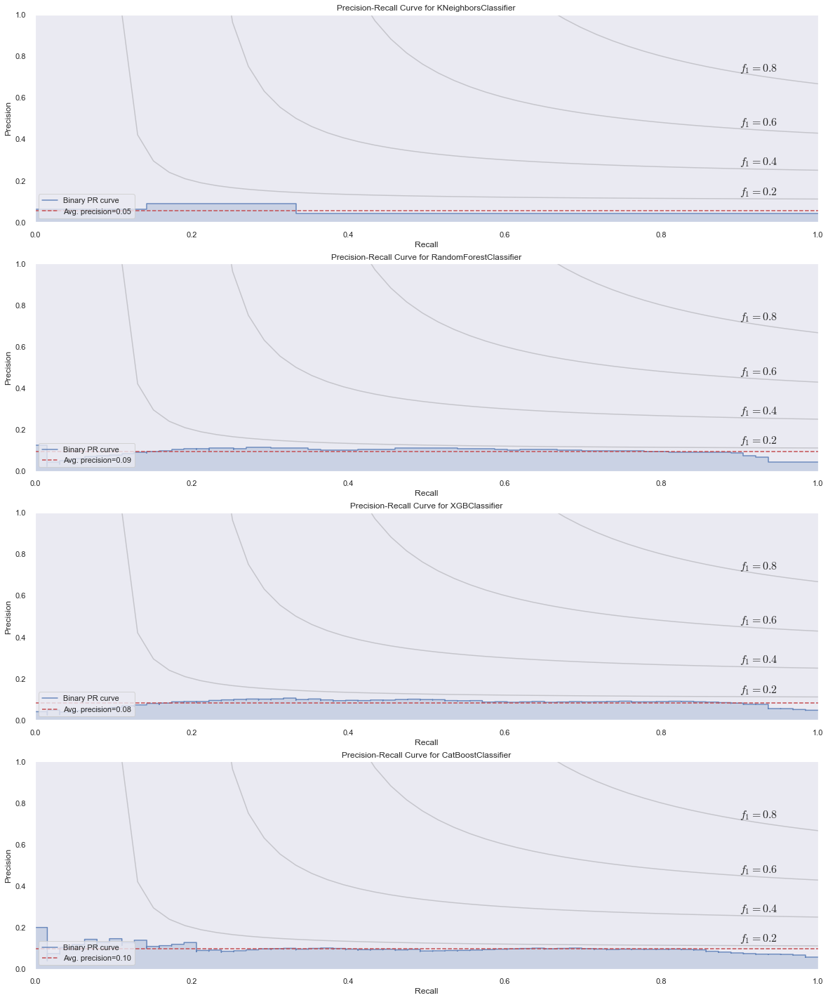

In [1036]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 25))

viz = PrecisionRecallCurve((knn_model), iso_f1_curves=True,ax=ax1)
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = PrecisionRecallCurve((rf_model), iso_f1_curves=True,ax=ax2)
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = PrecisionRecallCurve(xgb_model,iso_f1_curves=True, ax=ax3)
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

viz = PrecisionRecallCurve(wrap(cat_model),iso_f1_curves=True, ax=ax4)
viz.fit(x_train_boruta, y_train_boruta)
viz.score(x_test_boruta, y_test_boruta)
g = viz.finalize()

## 9.5 Cross-validation score
 The cross validation scores are very important metric because it takes in consideration that train/test split is random and it can give slightly different results each time. That being so, it splits the data in different ways and make different scores everytime. Here, it is divided in 12 parts and two different evaluation metrics: Recall and F1 weightedConclusion: the mean results of CatBoost algorithm are slightly better or very similar to Random Forest

In [1059]:
#Cross validation - Recall

cv_knn = ms.StratifiedKFold(n_splits=12, random_state=123, shuffle=True)
score_knn = ms.cross_val_score(knn_model, x_train_boruta, y_train_boruta, scoring='recall', cv=cv_reg, n_jobs=-1)
score_knn = pd.DataFrame(score_reg)

cv_rf = ms.StratifiedKFold(n_splits=12, random_state=123, shuffle=True)
score_rf = ms.cross_val_score(rf_model, x_train_boruta, y_train_boruta, scoring='recall', cv=cv_rf, n_jobs=-1)
score_rf = pd.DataFrame(score_rf)

cv_xgb = ms.StratifiedKFold(n_splits=12, random_state=123, shuffle=True)
score_xgb = ms.cross_val_score(xgb_model, x_train_boruta, y_train_boruta, scoring='recall', cv=cv_xgb, n_jobs=-1)
score_xgb = pd.DataFrame(score_xgb)

cv_cat = ms.StratifiedKFold(n_splits=12, random_state=123, shuffle=True)
score_cat = ms.cross_val_score(cat_model, x_train_boruta, y_train_boruta, scoring='recall', cv=cv_cat, n_jobs=-1)
score_cat = pd.DataFrame(score_cat)

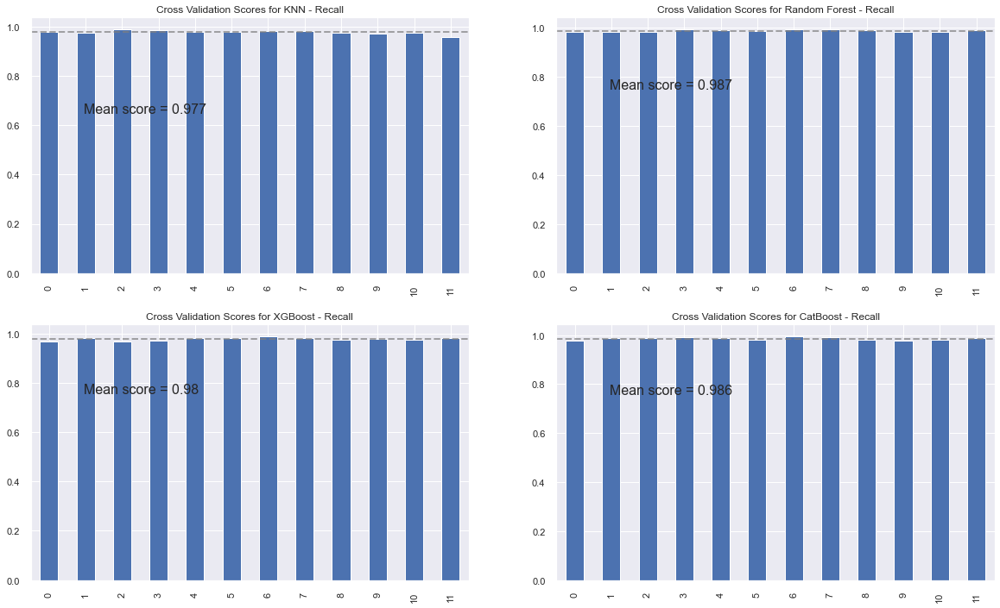

In [1041]:
# Plot CV - Recall
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(20, 12))

y_reg = float(score_knn.mean().round(3))
score_knn.plot(kind='bar', legend=False, ax=ax1) 
ax1.axhline(y=y_reg, color='gray', linewidth=2, alpha=.7, ls='--')
ax1.text(0.95,0.65, 'Mean score = {}'.format(y_reg)) 
ax1.set_title('Cross Validation Scores for KNN - Recall')

y_rf = float(score_rf.mean().round(3))
score_rf.plot(kind='bar', legend=False, ax=ax2) 
ax2.axhline(y=y_rf, color='gray', linewidth=2, alpha=.7, ls='--')
ax2.text(0.95,0.75, 'Mean score = {}'.format(y_rf)) 
ax2.set_title('Cross Validation Scores for Random Forest - Recall')

y_xgb = float(score_xgb.mean().round(3))
score_xgb.plot(kind='bar', legend=False, ax=ax3) 
ax3.axhline(y=y_xgb, color='gray', linewidth=2, alpha=.7, ls='--')
ax3.text(0.95,0.76, 'Mean score = {}'.format(y_xgb)) 
ax3.set_title('Cross Validation Scores for XGBoost - Recall')

y_cat = float(score_cat.mean().round(3))
score_cat.plot(kind='bar', legend=False, ax=ax4) 
ax4.axhline(y=y_cat, color='gray', linewidth=2, alpha=.7, ls='--')
ax4.text(0.95,0.76, 'Mean score = {}'.format(y_cat)) 
ax4.set_title('Cross Validation Scores for CatBoost - Recall') ;

## 9.6. Cumulative Gain Curve
 This chart shows the percentage of the overall number of cases a given category gained by targeting some percentage of the total number of cases. The greater the area between the baseline and the Cumulative Gain Curve, the better the model Conclusion: the distance between the baseline and CatBoost CGC curve is slightly better than the other models

<AxesSubplot:title={'center':'CatBoost - Cumulative Gains Curve'}, xlabel='Percentage of sample', ylabel='Gain'>

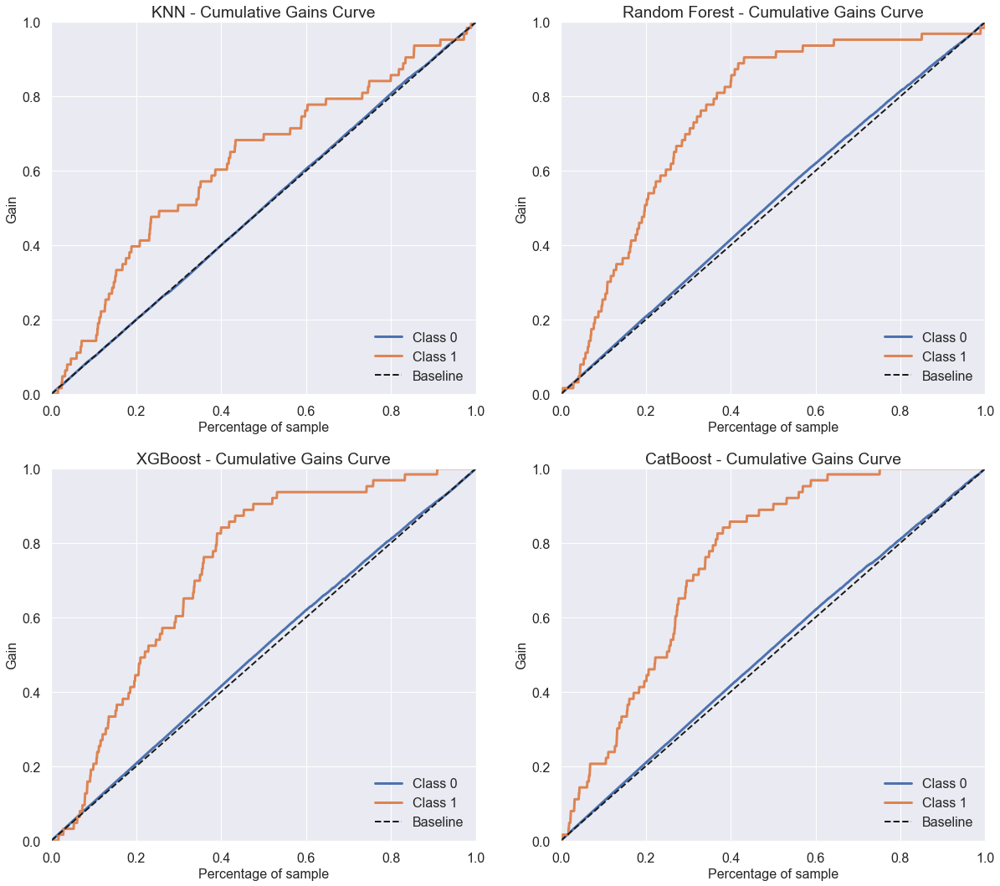

In [1053]:
#Plot Cumulative Gain Curve
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(20, 18))

y_proba_knn = knn_model.predict_proba(x_test_boruta)
plot_cumulative_gain(y_test_boruta, y_proba_reg, title='KNN - Cumulative Gains Curve', ax=ax1)
y_proba_rf = rf_model.predict_proba(x_test_boruta)
plot_cumulative_gain(y_test_boruta, y_proba_rf, title='Random Forest - Cumulative Gains Curve', ax=ax2)
y_proba_xgb = xgb_model.predict_proba(x_test_boruta)
plot_cumulative_gain(y_test_boruta, y_proba_xgb, title='XGBoost - Cumulative Gains Curve', ax=ax3) 
y_proba_cat = cat_model.predict_proba(x_test_boruta)
plot_cumulative_gain(y_test_boruta, y_proba_cat, title='CatBoost - Cumulative Gains Curve',ax=ax4) 

## 9.7. Lift Curve
 The Lift Curve chart is derived from the Cumulative Gains chart. The values on the y axis correspond to the ratio of the cumulative gain for each curve to the baselineConclusion: XGBoost and CatBoost have the two best Lift curves

<AxesSubplot:title={'center':'CatBoost - Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

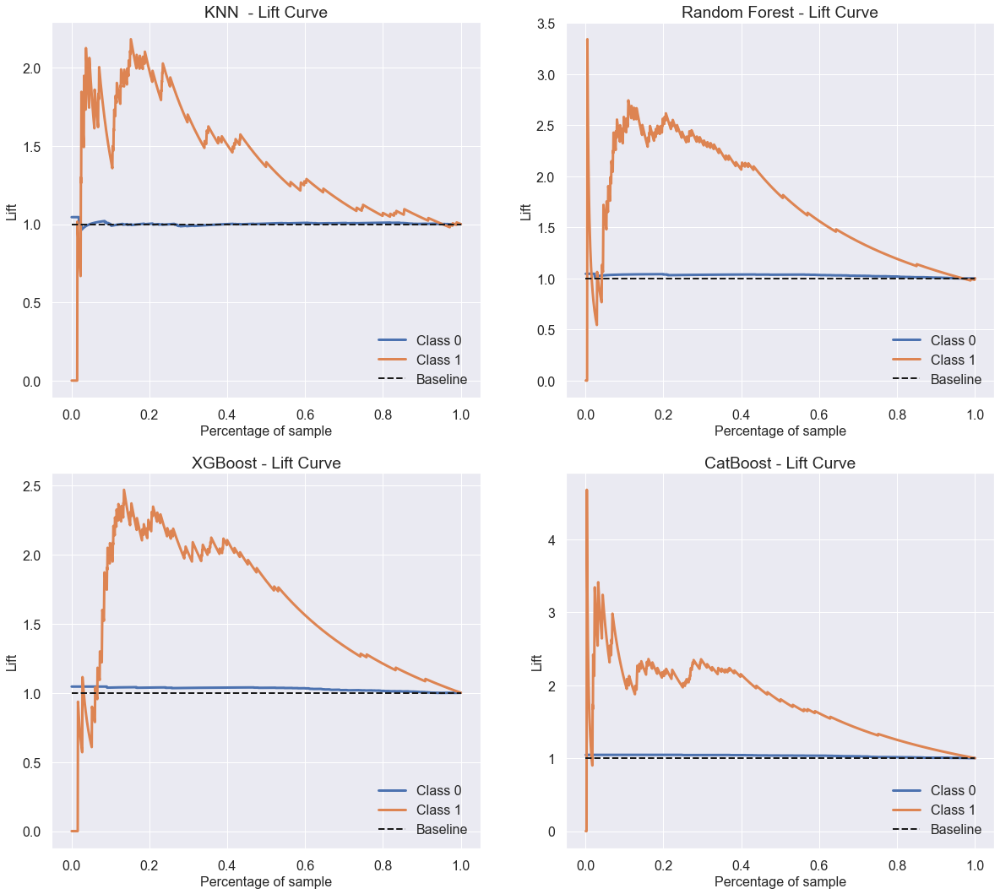

In [1054]:
#Plot Lift Curve
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(20, 18))

plot_lift_curve(y_test_boruta, y_proba_knn, title='KNN  - Lift Curve', ax=ax1)
plot_lift_curve(y_test_boruta, y_proba_rf, title='Random Forest - Lift Curve', ax=ax2)
plot_lift_curve(y_test_boruta, y_proba_xgb, title='XGBoost - Lift Curve', ax=ax3) 
plot_lift_curve(y_test_boruta, y_proba_cat, title='CatBoost - Lift Curve',ax=ax4) 

## 9.8. KS Statistic
 The ***Kolmogorov-Smirnov Statistic*** is used only in binary classification problems. It is the maximum difference between the cumulative True Positive and False Positive rate. It captures the model's power of discriminating positive labels from a negative labels. Therefore, the greater the distance between both curves, the betterConclusion: CatBoost has the greater distance between the True Positive and False Positive curves

<AxesSubplot:title={'center':'CatBoost - KS Statistic'}, xlabel='Threshold', ylabel='Percentage below threshold'>

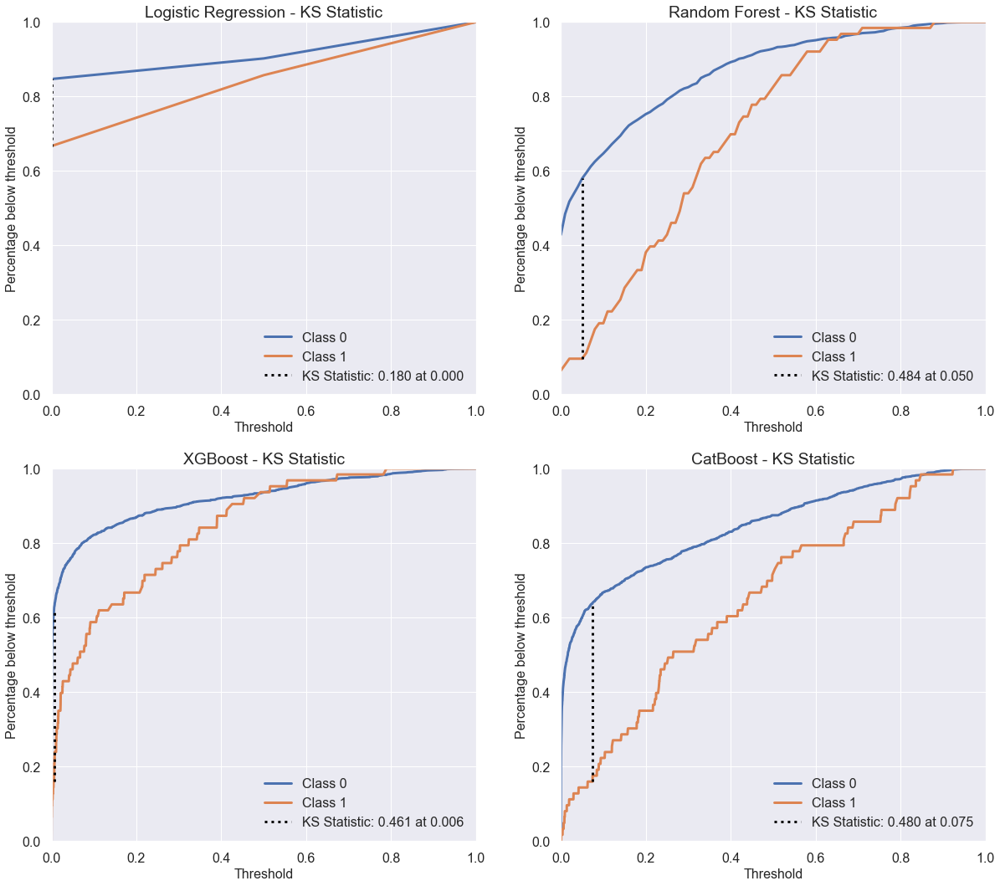

In [1058]:
#Plot Lift Curve
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(20, 18))

plot_ks_statistic(y_test_boruta, y_proba_knn, title='Logistic Regression - KS Statistic', ax=ax1)
plot_ks_statistic(y_test_boruta, y_proba_rf, title='Random Forest - KS Statistic', ax=ax2)
plot_ks_statistic(y_test_boruta, y_proba_xgb, title='XGBoost - KS Statistic', ax=ax3) 
plot_ks_statistic(y_test_boruta, y_proba_cat, title='CatBoost - KS Statistic',ax=ax4) 

# 10. Hyperparameter Fine Tuning 

### Random Search

In [624]:
param = {'n_estimators': [1500, 1700, 2500, 3000, 3500],
         'eta': [0.01, 0.03],
         'max_depth': [3, 5, 9],
         'subsample': [0.1, 0.5, 0.7],
         'colsample_bytree': [0.3, 0.7, 0.9],
         'min_child_weight': [3, 8, 15]}

MAX_EVAL = 5

In [634]:
final_result = pd.DataFrame()

for i in range(MAX_EVAL):
    # chose values for parameters randomly
    hp = {k: random.sample(v,1)[0] for k, v in param.items()}
    print(hp)
    
    # model
    model_xgb = XGBClassifier(n_estimators=hp['n_estimators'], 
                              eta=hp['eta'], 
                              max_depth=hp['max_depth'], 
                              subsample=hp['subsample'],
                              colsample_bytee=hp['colsample_bytree'],
                              min_child_weight=hp['min_child_weight']).fit(x_train, y_train)
    
    # predict
    y_hat = model_xgb.predict(x_test)

    print(m.confusion_matrix(y_test, y_hat))
    print(m.classification_report(y_test, y_hat))

{'n_estimators': 1700, 'eta': 0.01, 'max_depth': 5, 'subsample': 0.1, 'colsample_bytree': 0.9, 'min_child_weight': 8}
[17:12:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { colsample_bytee } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:12:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[736 227]
 [ 88 824]]
              precision    recall  f1-score   support

           0       0.89      0.76      0.82       963
           1       0.78      0.90      0.84    

### GridSearch

In [789]:
xgb_model

parameters = {base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None}

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [ ]:
GBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                                                                                  colsample_bynode=1, colsample_bytree=0.7, eta=0.03, gamma=0,
                                                                                  gpu_id=-1, importance_type='gain', interaction_constraints='',
                                                                                  learning_rate=0.0299999993, max_delta_step=0, max_depth=9,
                                                                                  min_child_weight=3, monotone_constraints='()',
                                                                                  n_estimators=1700, n_jobs=4, num_parallel_tree=1,                                                                                               random_state=0,
                                                                                  reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
                                                                                  tree_method='exact', validate_parameters=1, verbosity=None)

In [799]:
param = {'n_estimators': [1600, 1700,1800],
         'eta': [0.02, 0.03, 0.04],
         'max_depth': [9, 10, 12],
         'subsample': [0.7, 0.8, 0.9],
         'colsample_bytree': [0.5, 0.7, 0.8],
         'min_child_weight': [2, 3, 5]}

In [800]:
from sklearn.model_selection import GridSearchCV 

In [801]:
classifier = GridSearchCV(XGBClassifier(), param, verbose=1,cv=3,n_jobs=-1)
classifier.fit(x_train, y_train)

# took 2h40min the firt time

Fitting 3 folds for each of 729 candidates, totalling 2187 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 48.7min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 117.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 192.9min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 316.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 493.3min
[Parallel(n_jobs=-1)]: Done 2187 out of 2187 | elapsed: 597.5min finished
c:\users\lucas\miniconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs...
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [803]:
classifier.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, eta=0.04, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0399999991, max_delta_step=0, max_depth=10,
              min_child_weight=2, missing=nan, monotone_constraints='()',
              n_estimators=1700, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [823]:
xgb_cv = cross_validation_classification(df6, "XGBoost Classifier", XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, eta=0.04, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0399999991, max_delta_step=0, max_depth=10,
              min_child_weight=2, monotone_constraints='()',
              n_estimators=1700, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
              tree_method='exact', validate_parameters=1, verbosity=None))

xgb_cv

c:\users\lucas\miniconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,XGBoost Classifier,0.95+-0.004,0.95+-0.004,0.958+-0.008,0.943+-0.005,0.95+-0.004


In [ ]:
itting 3 folds for each of 486 candidates, totalling 1458 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 75.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 133.9min
[Parallel(n_jobs=-1)]: Done 1458 out of 1458 | elapsed: 163.0min finished
c:\users\lucas\miniconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs...
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, validate_parameters=None,
                                     verbosity=None),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.3, 0.7, 0.9],
                         'eta': [0.01, 0.03], 'max_depth': [3, 5, 9],
                         'min_child_weight': [3, 8, 15],
                         'n_estimators': [1500, 1700, 2500],
                         'subsample': [0.1, 0.5, 0.7]},
             verbose=1)

In [794]:
classifier.best_estimator_
# first best param by SearchGrid
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, eta=0.03, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0299999993, max_delta_step=0, max_depth=9,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=1700, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
              tree_method='exact', validate_parameters=1, verbosity=None)
# second best param by SearchGrid
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, eta=0.04, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0399999991, max_delta_step=0, max_depth=10,
              min_child_weight=2, missing=nan, monotone_constraints='()',
              n_estimators=1700, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
              tree_method='exact', validate_parameters=1, verbosity=None)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, eta=0.03, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0299999993, max_delta_step=0, max_depth=9,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=1700, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [819]:
xgb_cv = cross_validation_classification(df6, "XGBoost Classifier", XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                                                                                  colsample_bynode=1, colsample_bytree=0.7, eta=0.03, gamma=0,
                                                                                  gpu_id=-1, importance_type='gain', interaction_constraints='',
                                                                                  learning_rate=0.0299999993, max_delta_step=0, max_depth=9,
                                                                                  min_child_weight=3, monotone_constraints='()',
                                                                                  n_estimators=1700, n_jobs=4, num_parallel_tree=1,                                                                                               random_state=0,
                                                                                  reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
                                                                                  tree_method='exact', validate_parameters=1, verbosity=None))
xgb_cv

c:\users\lucas\miniconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,XGBoost Classifier,0.943+-0.004,0.943+-0.004,0.961+-0.01,0.929+-0.005,0.945+-0.003


In [798]:
# Gradient boosting - XGBoost tuned
# model definition
xgb_model = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, eta=0.03, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0299999993, max_delta_step=0, max_depth=9,
              min_child_weight=3, monotone_constraints='()',
              n_estimators=1700, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
              tree_method='exact', validate_parameters=1, verbosity=None)

# model training
xgb_model.fit(x_train, y_train)

# predict
y_hat = xgb_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

c:\users\lucas\miniconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[915  48]
 [ 32 880]]
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       963
           1       0.95      0.96      0.96       912

    accuracy                           0.96      1875
   macro avg       0.96      0.96      0.96      1875
weighted avg       0.96      0.96      0.96      1875



### GridSearch with CatBoost Classifier

In [826]:
cat_model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'Logloss',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': False,
 'model_size_reg': 0.5,
 'subsample': 0.800000011920929,
 'use_best_model': False,
 'class_names': [0, 1],
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'Logloss',
 'learning_rate': 0.024351000785827637,
 'score_function': 'Cosine',
 'task_type': 'CPU',
 'leaf_estimation_iterations': 10,
 'bo

In [831]:
x_train.dtypes # gender ever married smoling

gender                 int32
age                  float64
ever_married           int32
avg_glucose_level    float64
bmi                  float64
smoking_status         int64
age_glucose          float64
age_bmi              float64
glucose_bmi          float64
dtype: object

In [832]:
x_test.dtypes

gender                 int32
age                  float64
ever_married           int32
avg_glucose_level    float64
bmi                  float64
smoking_status         int64
age_glucose          float64
age_bmi              float64
glucose_bmi          float64
dtype: object

In [863]:
x_train_cat = x_train.copy()
x_test_cat = x_test.copy()

y_train_cat = y_train.copy()
y_test_cat = y_test.copy()

# categorical features must be converted to 'str'
x_train_cat[['gender', 'ever_married', 'smoking_status']] = x_train[['gender', 'ever_married', 'smoking_status']].astype(str)
x_test_cat[['gender', 'ever_married', 'smoking_status']] = x_test[['gender', 'ever_married', 'smoking_status']].astype(str)

y_train_cat = y_train.astype(int)
y_test_cat = y_test.astype(int)

In [856]:
x_train_cat.reset_index()

,index,gender,age,ever_married,avg_glucose_level,bmi,smoking_status,age_glucose,age_bmi,glucose_bmi
0,2661,1,0.008789,0,-0.450959,0.535670,0,-0.998893,0.006276,-0.341556
1,2416,1,0.670410,1,-0.198356,0.204598,3,0.191142,0.415018,-0.293921
2,9301,0,0.826331,0,-0.274904,-0.216058,0,0.422426,0.455947,-0.491754
3,8545,0,0.979938,0,-0.341421,-0.537262,2,0.634910,0.490958,-0.651005
4,8854,0,0.923460,1,3.791019,0.636154,0,3.519463,0.632046,2.593319
...,...,...,...,...,...,...,...,...,...,...
7492,1487,0,0.401855,0,-0.365479,-0.432080,1,-0.343379,0.208050,-0.615286
7493,5315,0,0.959752,1,-0.078380,-0.771647,0,0.800978,0.444852,-0.590788
7494,8560,1,0.714844,1,0.067507,1.766752,0,0.419519,0.621145,0.519946
7495,3409,1,0.462891,1,0.014795,1.516154,1,-0.104766,0.383552,0.366419


In [853]:
y_train_cat

2661    0
2416    0
9301    1
8545    1
8854    1
       ..
1487    0
5315    1
8560    1
3409    0
6101    1
Name: stroke, Length: 7497, dtype: object

In [864]:
#GridSearchCV 

model = CatBoostClassifier()

df_categories = ['gender', 'age', 'ever_married', 'avg_glucose_level', 'bmi', 'smoking_status', 'age_glucose', 'age_bmi', 'glucose_bmi']            

params = {'learning_rate':[0.05, 0.065, 0.07, 0.075, 0.08], 'cat_features':[df_categories], 'iterations':[400,600, 800],'depth':[4, 5, 6, 7], 'eval_metric':['Recall'], 'verbose':[False], 'random_state':[123]}

grid_search = GridSearchCV(estimator=model, param_grid=params, scoring='recall', n_jobs=-1, cv=12, return_train_score=True)

grid_search.fit(x_train, y_train)

CatBoostError: Invalid type for cat_feature[non-default value idx=0,feature_idx=1]=0.0087890625 : cat_features must be integer or string, real number values and NaN values should be converted to string.